In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import config
import sklearn
from sklearn import metrics
from tqdm import tqdm
import config
import designimg as d
import glob

In [15]:
glob.glob(f'{config.RESIZED_IMAGE_PATH}train/*.npy')

['/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/3b9ff5c10b3b.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/3197414ebc35.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/31f5733437b3.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/339d8243e83d.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/386a917a8961.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/30d8c0df51bb.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/37a0e5c6b9b7.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/38b09ea8e0d7.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/3559ff2d18e8.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/304e2315b5dd.npy',
 '/mnt/gfs/gv1/project_sonar_data/seti/resized_images_seti/256258/train/3cfc4637b093.npy',

-4.805336e-08 1.0


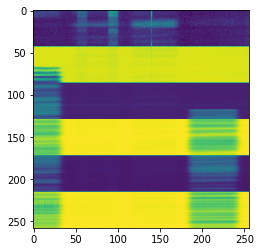

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import config
import designimg as d
import dataset as a
import glob
i = a.SetiDataset(glob.glob(f'{config.RESIZED_IMAGE_PATH}train/*.npy'), targets = [1], ids =[0], resize=None, augmentations = None)[0]
plt.figure()
plt.imshow(i['images'][0])
plt.show()

In [17]:
path = f'SETI/output/resnet18d_bs32_AllChl256258_mixupTrue_augSwapDropFlip_ohemFalse_scdCosineAnnealingWarmRestarts_dt061505/auc_oof_df_resnet18d_bs32_AllChl256258_mixupTrue_augSwapDropFlip_ohemFalse_scdCosineAnnealingWarmRestarts_dt061505.csv'
oof_path = f'/home/asajw/{path}'

In [18]:
oof = pd.read_csv(oof_path)
oof.head()

,predictions,targets,target_ids
0,0.029485,0.0,3060
1,0.001059,0.0,11229
2,0.726243,1.0,4403
3,0.010095,0.0,46280
4,0.001439,0.0,6852


In [19]:
oof.targets.value_counts()

0.0    45471
1.0     4694
Name: targets, dtype: int64

In [20]:
# defining tp, tn, fp, fn from basic

class Metrics():
    def __init__(self, ytrue, ypred):
        self.ytrue = ytrue
        self.ypred = ypred
        
    def true_pos(self):
        tp = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 1 and yp == 1:
                tp += 1
        return tp

    def true_neg(self):
        tn = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 0 and yp == 0:
                tn += 1
        return tn

    def false_pos(self):
        fp = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 0 and yp == 1:
                fp += 1
        return fp

    def false_neg(self):
        fn = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 1 and yp == 0:
                fn += 1
        return fn

    def precision(self):
        tp = self.true_pos()
        fp = self.false_pos()
        return tp / (tp + fp)

    def recall(self):
        tp = self.true_pos()
        fn = self.false_neg()  
        return tp / (tp + fn)
    
    def f1(self):
        p = self.precision()
        r = self.recall()
        return 2*p*r / (p +r)
    
    def tpr(self):
        return self.recall()
    
    def fpr(self):
        fp = self.false_pos()
        tn = self.true_neg()
        return fp / (fp + tn)
    
    def roc_auc(self):
        return metrics.roc_auc_score(self.ytrue, self.ypred)
    
    

In [21]:
thresholds = [x*oof.predictions.max()/100 for x in range(int(oof.predictions.max()*100))]

In [22]:
mDF = pd.DataFrame({
                    'threshold':[],
                    'fp':[], 'fn':[], 'tn':[], 'tp':[],
                    'precision':[], 'recall':[],
                    'tpr':[], 'fpr':[],
                    'f1':[], 'roc_threshold':[],
                    })


In [23]:
for i, threshold in tqdm(enumerate(thresholds)):
    ypred = oof['predictions'].values.tolist()
    ypred = [1 if y > threshold else 0 for y in ypred]
    ytrue = oof['targets'].values.tolist()
    m = Metrics(ytrue, ypred)
    mDF.loc[i, 'threshold'] = threshold
    mDF.loc[i, 'fp'] = m.false_pos()
    mDF.loc[i,'fn'] = m.false_neg()
    mDF.loc[i,'tp'] = m.true_pos()
    mDF.loc[i,'tn'] = m.true_neg()
    mDF.loc[i,'precision'] = m.precision()
    mDF.loc[i,'recall'] = m.recall()
    mDF.loc[i,'tpr'] = m.tpr()
    mDF.loc[i,'fpr'] = m.fpr()
    mDF.loc[i,'f1'] = m.f1()
    mDF.loc[i,'roc_threshold'] = m.roc_auc()

99it [00:07, 13.56it/s]


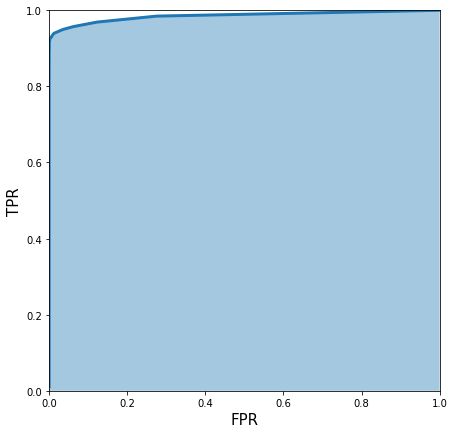

In [24]:
plt.figure(figsize=(7,7))
plt.fill_between(mDF['fpr'].values.tolist(), mDF['tpr'].values.tolist(), alpha = 0.4)
plt.plot(mDF['fpr'].values.tolist(), mDF['tpr'].values.tolist(), lw = 3)
plt.xlim(0, 1.0)
plt.ylim(0, 1.0)
plt.xlabel('FPR', fontsize = 15)
plt.ylabel('TPR', fontsize = 15)
plt.show()

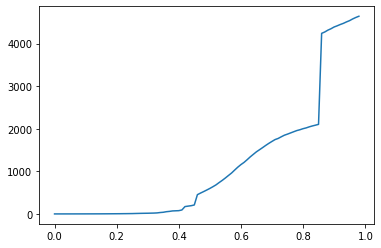

In [25]:
mDF['sweet_spot'] = (mDF['fn']+1)/( pow(mDF['fp'],1) + 1)
plt.plot(mDF['threshold'][:800], mDF['sweet_spot'][:800])
plt.show()

In [26]:
mDF.query('threshold >0.5 and threshold < 0.6')

,threshold,fp,fn,tn,tp,precision,recall,tpr,fpr,f1,roc_threshold,sweet_spot
51,0.509579,1.0,1278.0,45470.0,3416.0,0.999707,0.727738,0.727738,0.000022,0.842313,0.863858,639.5
52,0.519570,1.0,1365.0,45470.0,3329.0,0.999700,0.709203,0.709203,0.000022,0.829761,0.854591,683.0
53,0.529562,1.0,1473.0,45470.0,3221.0,0.999690,0.686195,0.686195,0.000022,0.813795,0.843087,737.0
54,0.539554,1.0,1575.0,45470.0,3119.0,0.999679,0.664465,0.664465,0.000022,0.798311,0.832222,788.0
55,0.549546,1.0,1687.0,45470.0,3007.0,0.999668,0.640605,0.640605,0.000022,0.780836,0.820292,844.0
56,0.559537,1.0,1805.0,45470.0,2889.0,0.999654,0.615467,0.615467,0.000022,0.761867,0.807722,903.0
57,0.569529,1.0,1921.0,45470.0,2773.0,0.999640,0.590754,0.590754,0.000022,0.742635,0.795366,961.0
58,0.579521,1.0,2060.0,45470.0,2634.0,0.999620,0.561142,0.561142,0.000022,0.718788,0.780560,1030.5
59,0.589512,1.0,2195.0,45470.0,2499.0,0.999600,0.532382,0.532382,0.000022,0.694746,0.766180,1098.0
60,0.599504,1.0,2315.0,45470.0,2379.0,0.999580,0.506817,0.506817,0.000022,0.672604,0.753398,1158.0


In [33]:
threshold_fp = 0.7#to identify the real fp set it high
oof['predictions_bool_fp'] = oof['predictions'].apply(lambda x : 0 if x < threshold_fp else 1)  
oof['fp'] = oof.apply(lambda x: Metrics([x['targets']],
                                        [x['predictions_bool_fp']]).false_pos(), axis = 1) 
threshold_fn = 0.1 # to identify the real fn set it low
oof['predictions_bool_fn'] = oof['predictions'].apply(lambda x : 0 if x < threshold_fn else 1)  
oof['fn'] = oof.apply(lambda x: Metrics([x['targets']],
                                        [x['predictions_bool_fn']]).false_neg(), axis = 1)

In [34]:
oof.query('fp == 1')
oof.query('fn == 1')

,predictions,targets,target_ids,predictions_bool_fp,fp,predictions_bool_fn,fn
64,0.020021,1.0,3899,0,0,0,1
192,0.000856,1.0,25565,0,0,0,1
199,0.014139,1.0,15382,0,0,0,1
257,0.006139,1.0,23427,0,0,0,1
419,0.040221,1.0,46021,0,0,0,1
...,...,...,...,...,...,...,...
49477,0.050202,1.0,24004,0,0,0,1
49590,0.006791,1.0,11140,0,0,0,1
49628,0.049257,1.0,8494,0,0,0,1
49794,0.028661,1.0,49975,0,0,0,1


In [35]:
tr = pd.read_csv(f'{config.DATA_PATH}train_labels.csv')
trfp = tr[tr.index.isin(oof.query('fp == 1')['target_ids'].values.tolist())]
trfn = tr[tr.index.isin(oof.query('fn == 1')['target_ids'].values.tolist())]

In [36]:
# negative images classified as positive (fp)
print(trfp.head(), '\n\n', trfn.head())

                 id  target
23826  78d268542819       0 

                 id  target
85    0078157399c9       1
437   02616cd942c6       1
865   0472c280fdd6       1
1622  0842218f302a       1
1838  097057653f43       1


In [37]:
def disp_image(image_path, size = (8,6)):
    img = np.load(image_path)
#     print(img)
    plt.figure(figsize = size)
    plt.imshow(img)
    plt.show()

78d268542819


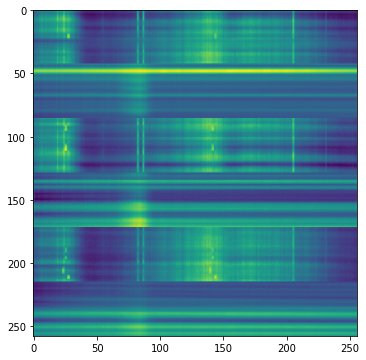

In [38]:
#images classified as positive but aren't
pos_imgs = trfp.id.values
for i in pos_imgs[:]:
    print(i)
    disp_image(f'{config.RESIZED_IMAGE_PATH}train/{i}.npy')

In [95]:
trfn.query('id == "00667e94a985"')

,id,target
76,00667e94a985,1


In [40]:
pos_imgs

array(['0078157399c9', '02616cd942c6', '0472c280fdd6', '0842218f302a',
       '097057653f43', '0b2b0069dd50', '0b7eee0e8d5a', '0c0df7bfb23e',
       '0c40d55c1481', '0c7e18de2e3d', '0cc4c8dafa69', '128665de9e88',
       '12ca5be70bd4', '13b561c0ab53', '14000ab77587', '14308f15f730',
       '1462fb566eb8', '1550a2706872', '15ad0420b5a5', '15c228a310a9',
       '163977286841', '17a7c5217942', '17e564a59280', '18adcf9035f7',
       '1a14c57e8f24', '1a4b23f9a172', '1a6ea827da87', '1c1307e5ca76',
       '1c51c8bddb19', '1d984a1a3710', '1fecdaef44e8', '2064d5ebe9b5',
       '20bbc9da4bb2', '24349b96ea8d', '2462f14205be', '248ef095d89d',
       '2503d7f6e5c4', '25213186b2ee', '269f10aceb23', '26d0871f3b32',
       '27047a900522', '27efcfbc6941', '288ea03a6e4e', '296416d70414',
       '2b4f13d2cdf2', '2b8fc1b0c116', '2bba01d2e1d2', '2cf6ebf6a942',
       '2d893ae6f34e', '32941cf45d9e', '3301461e76c8', '33097417fa17',
       '336b4b1f0d02', '336c1929111d', '33a2c973c431', '33a5814d5999',
      

0 0078157399c9


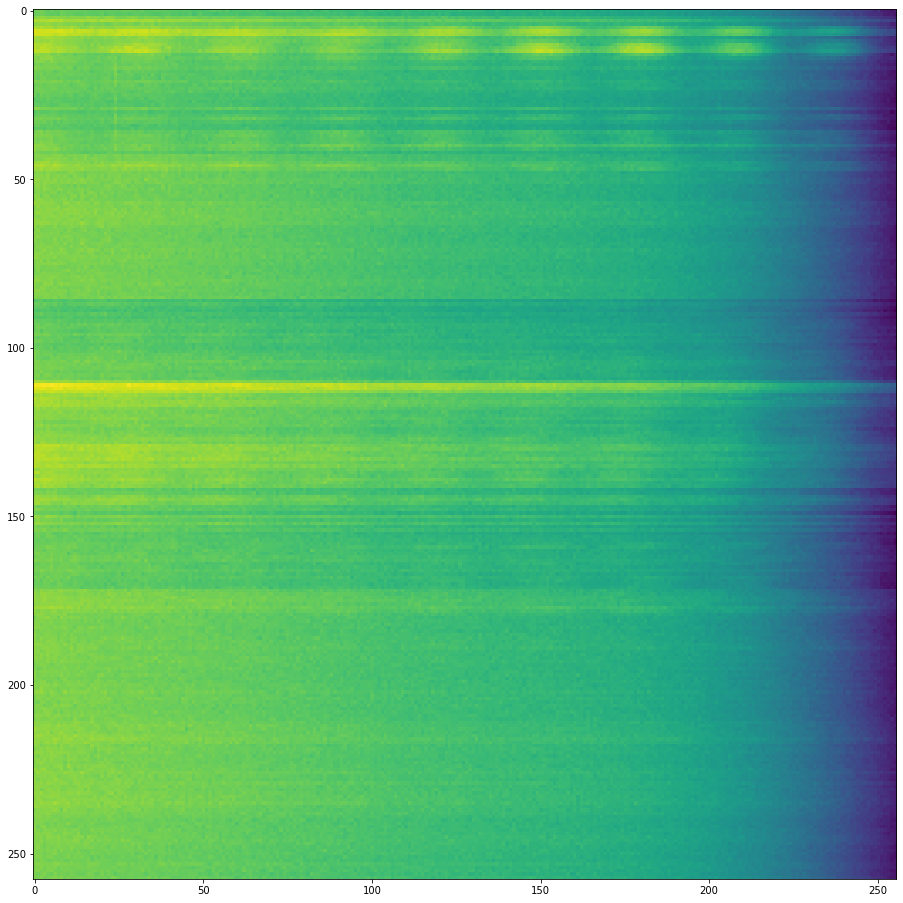

1 02616cd942c6


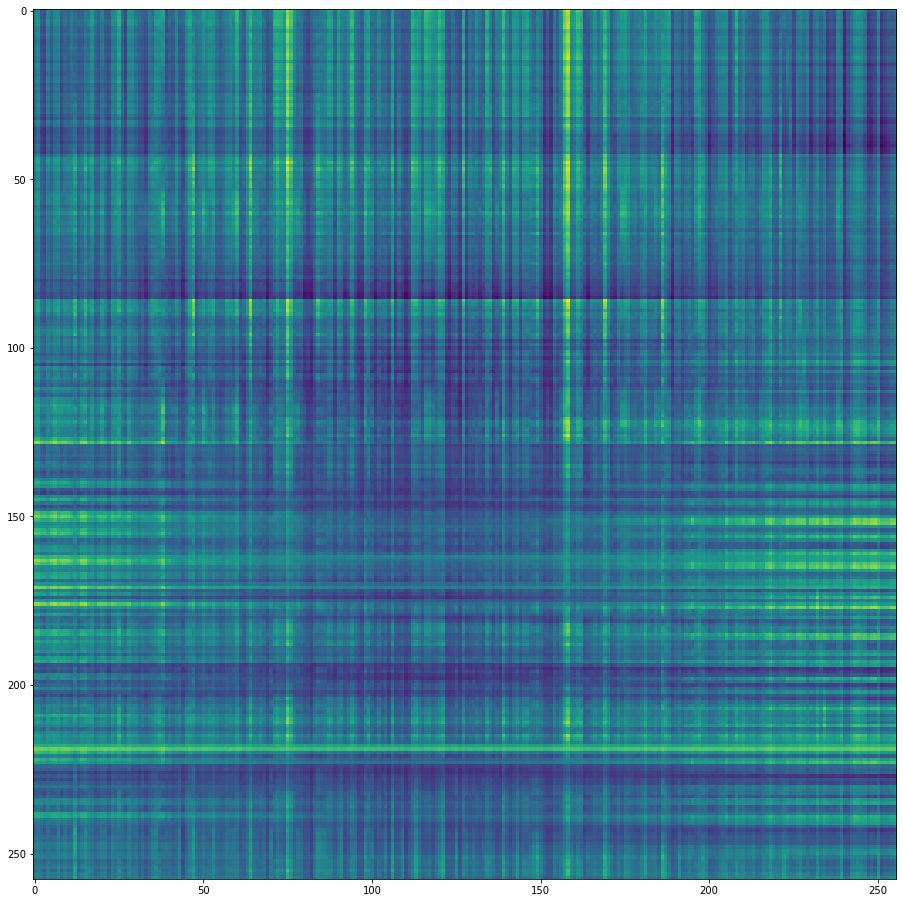

2 0472c280fdd6


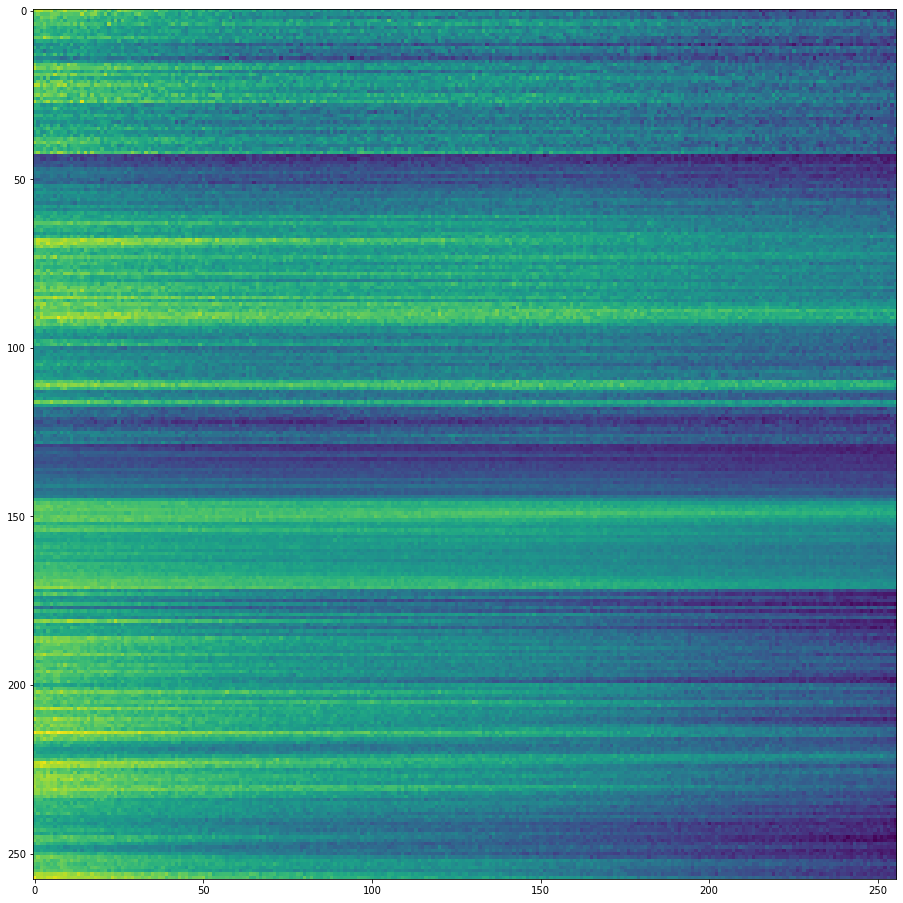

3 0842218f302a


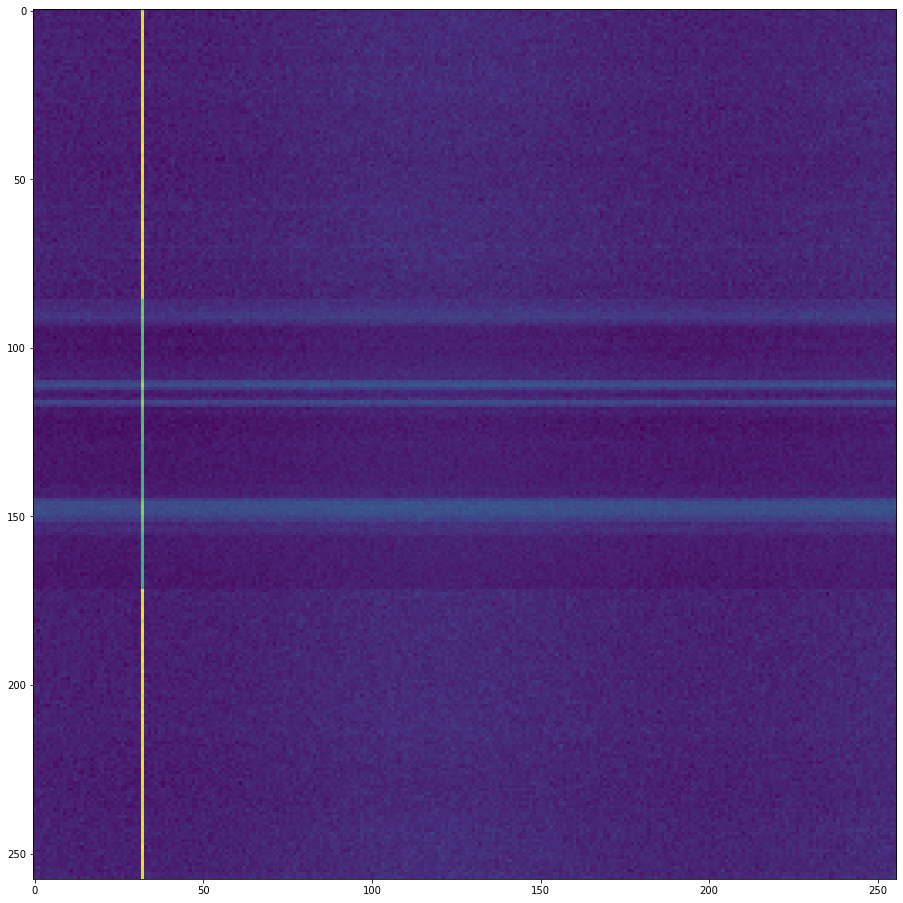

4 097057653f43


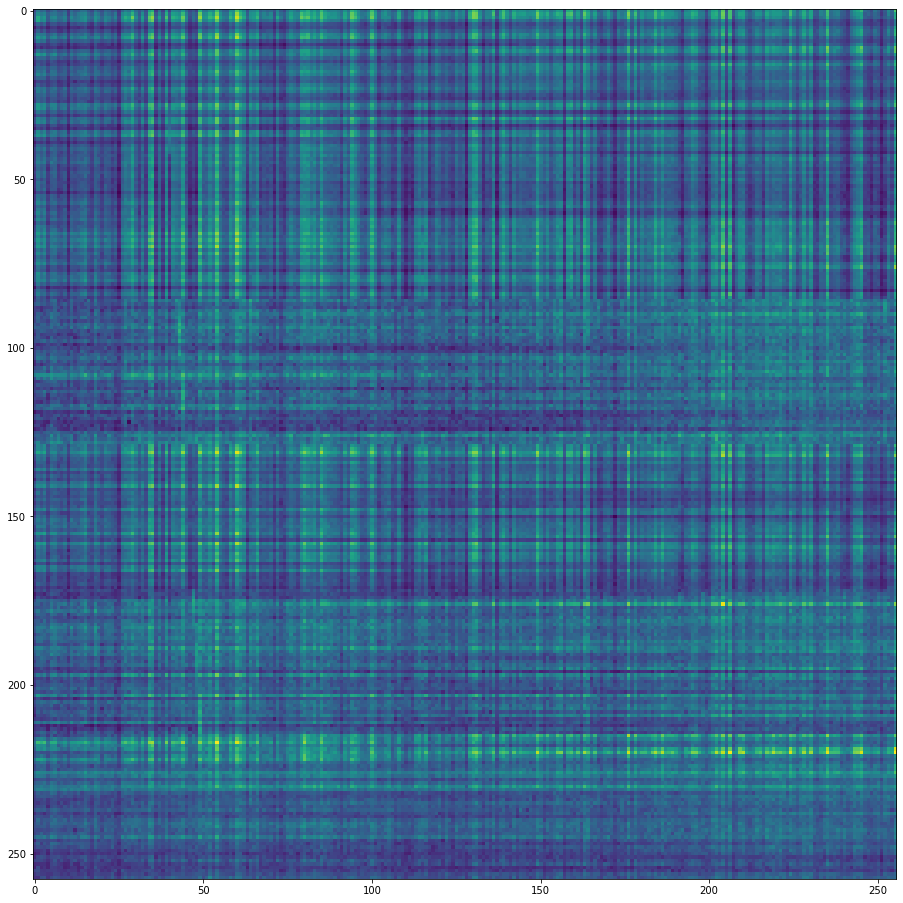

5 0b2b0069dd50


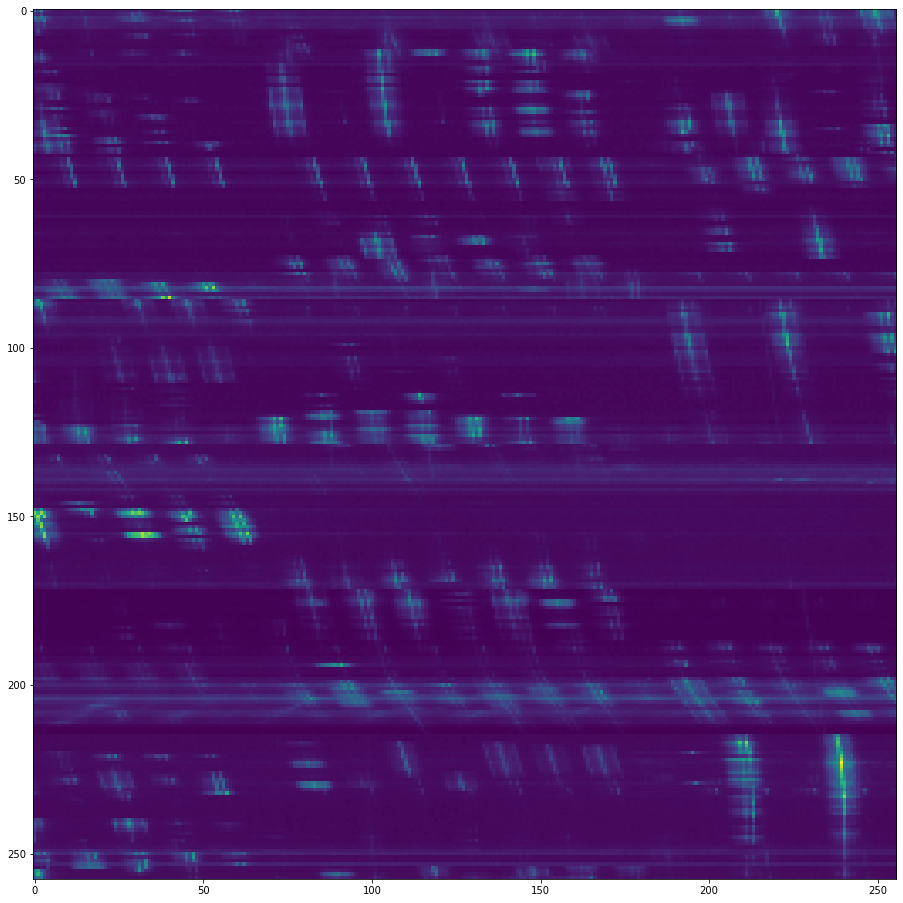

6 0b7eee0e8d5a


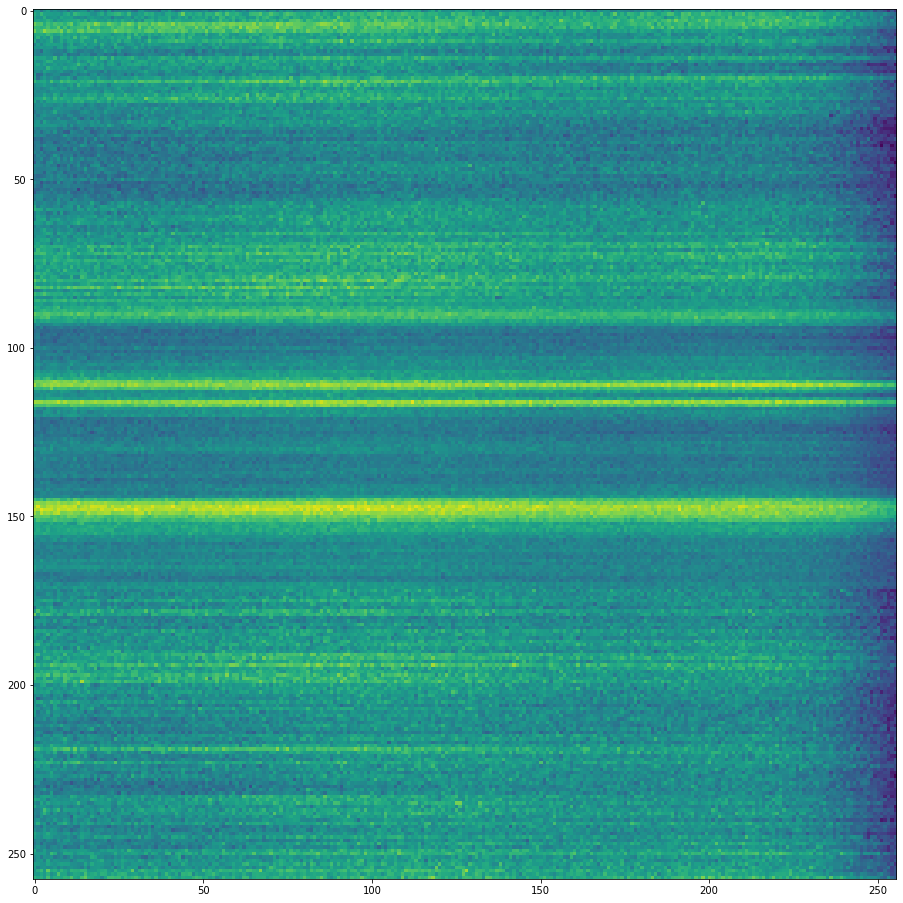

7 0c0df7bfb23e


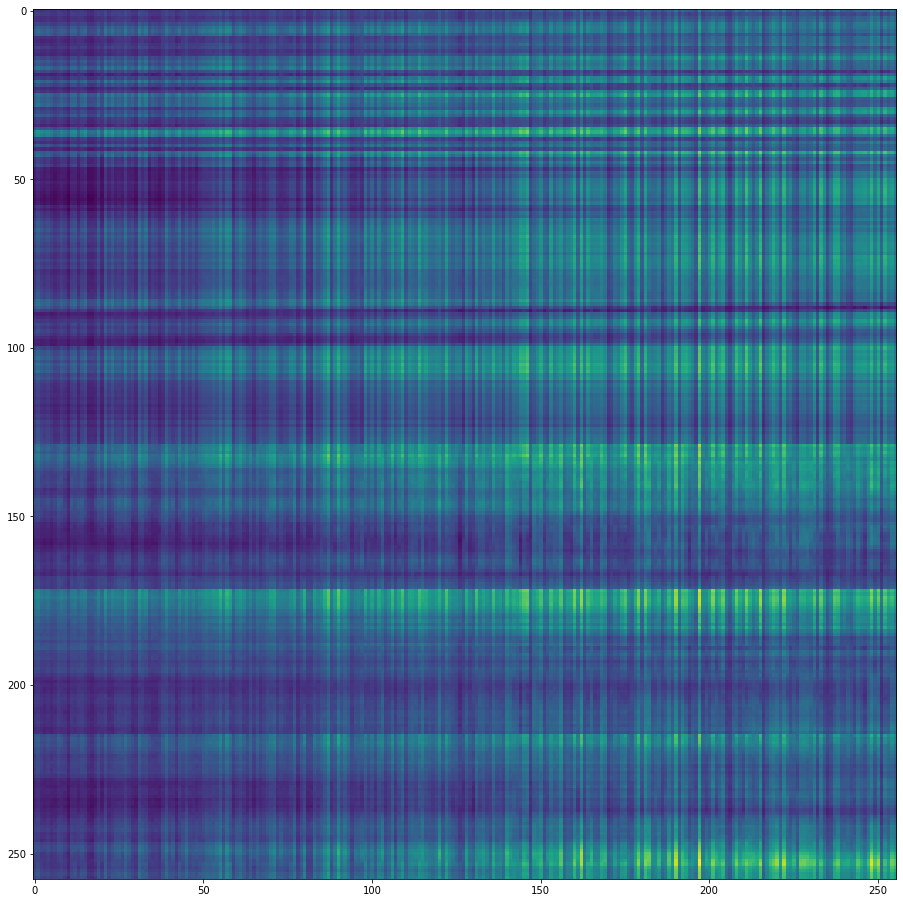

8 0c40d55c1481


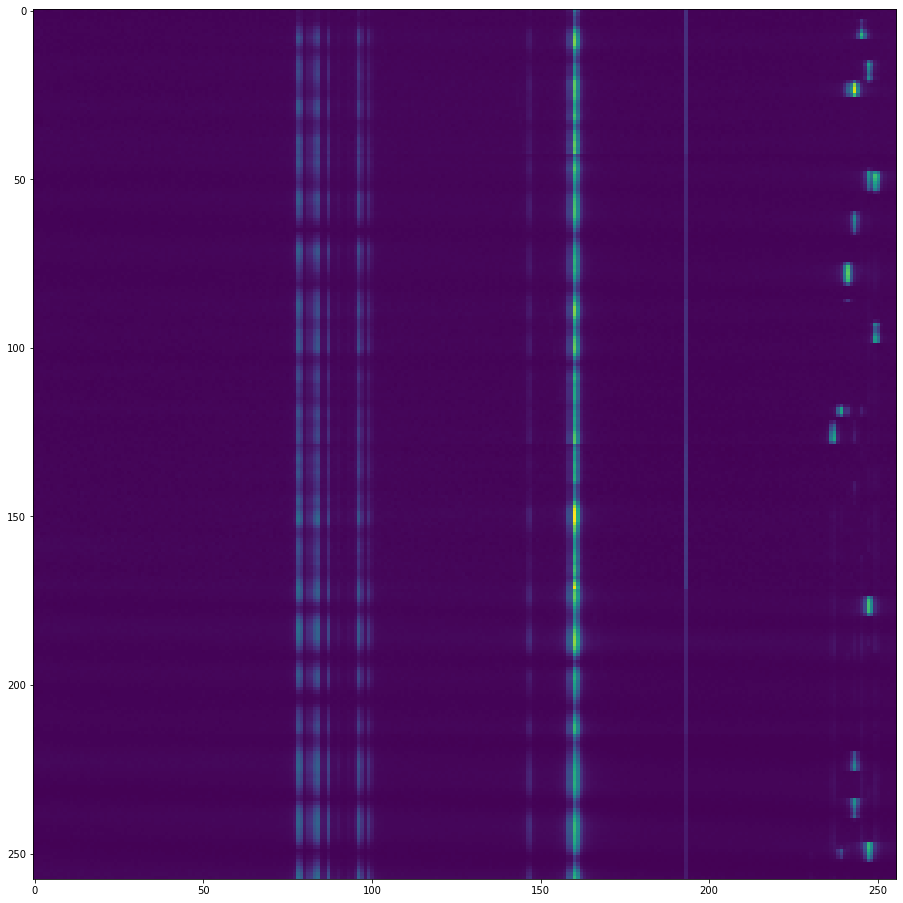

9 0c7e18de2e3d


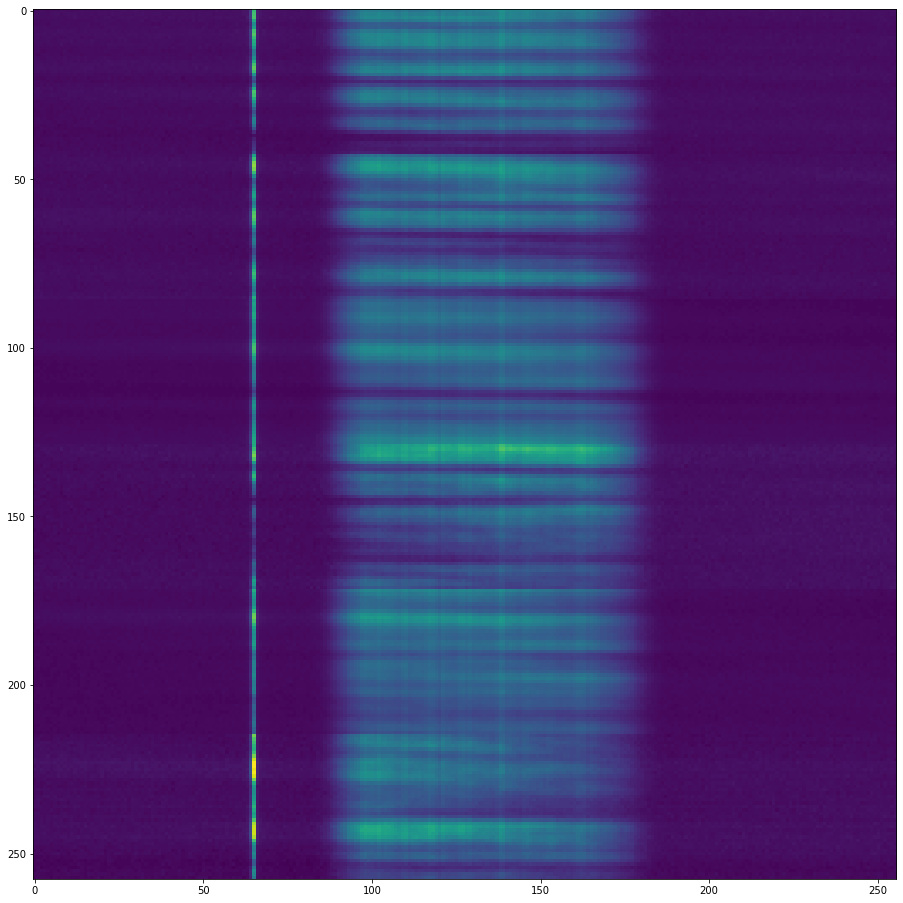

10 0cc4c8dafa69


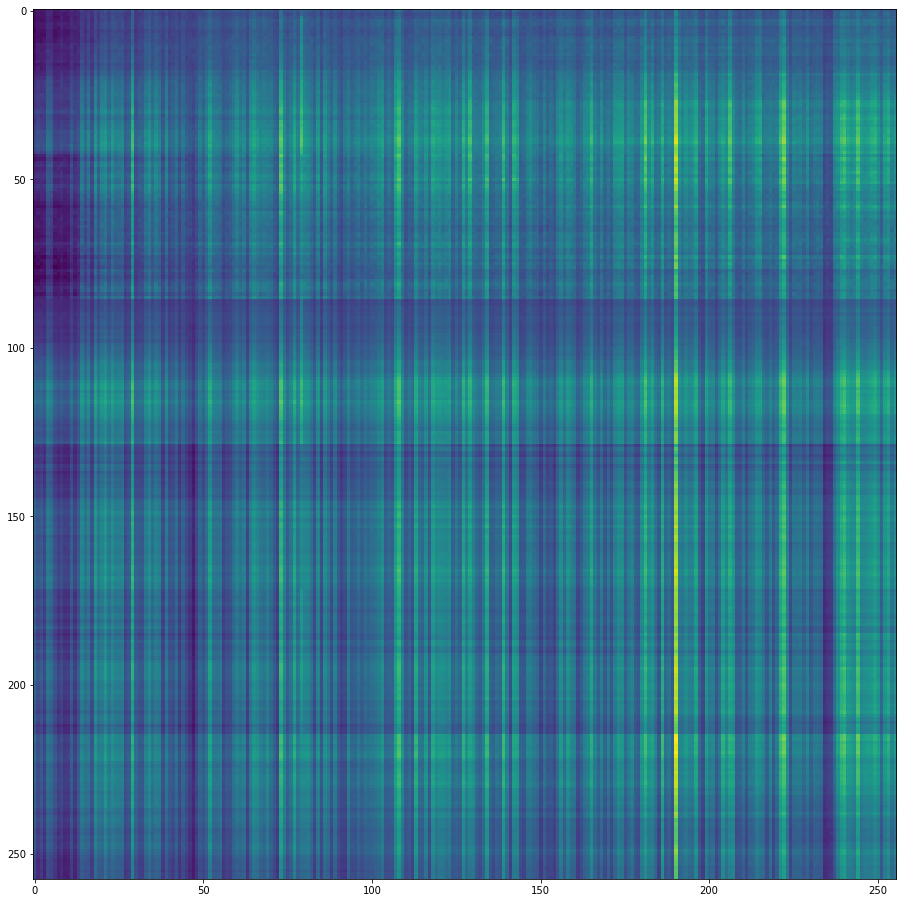

11 128665de9e88


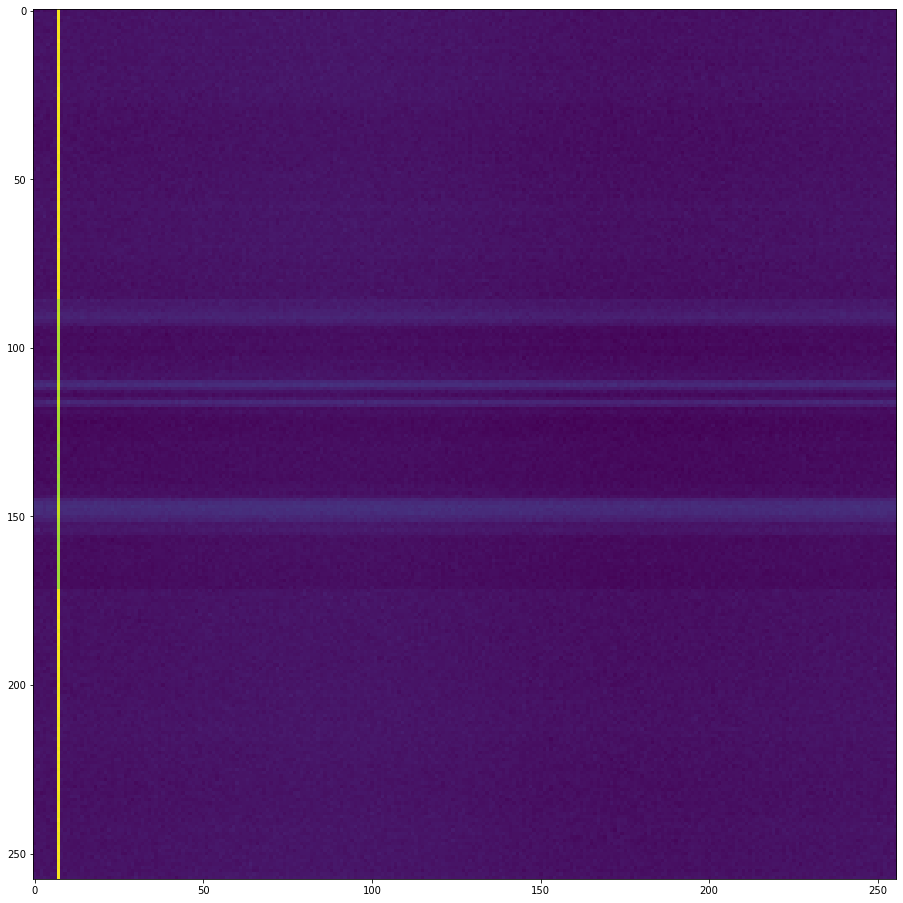

12 12ca5be70bd4


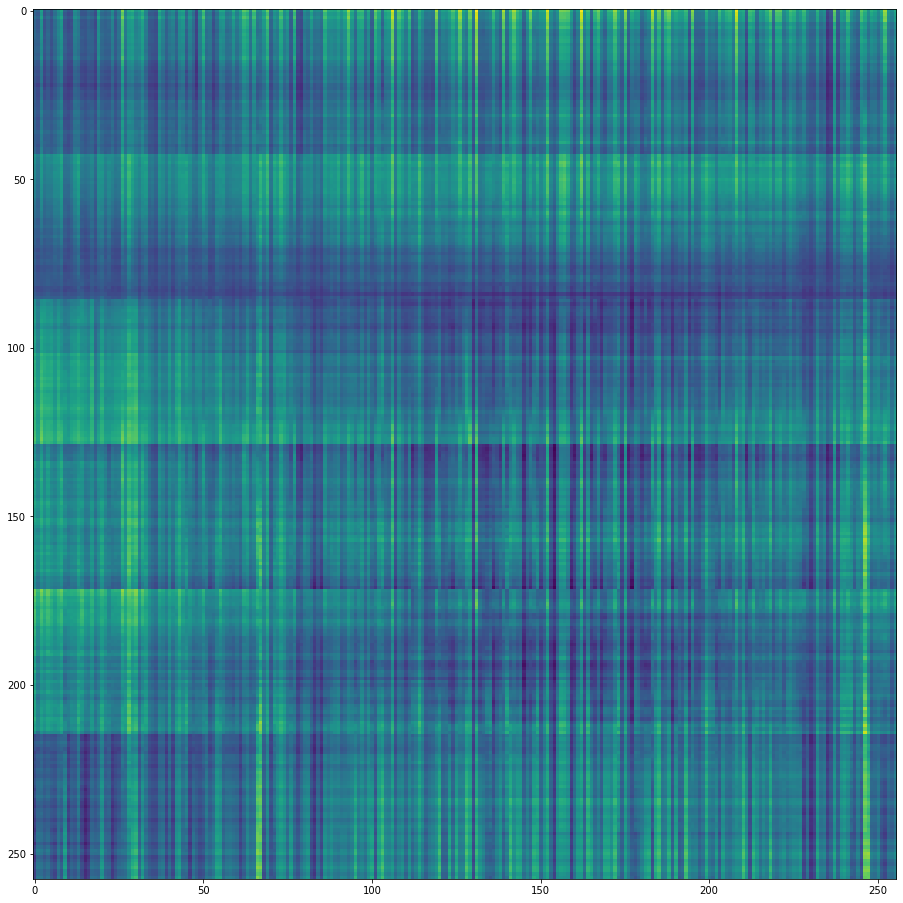

13 13b561c0ab53


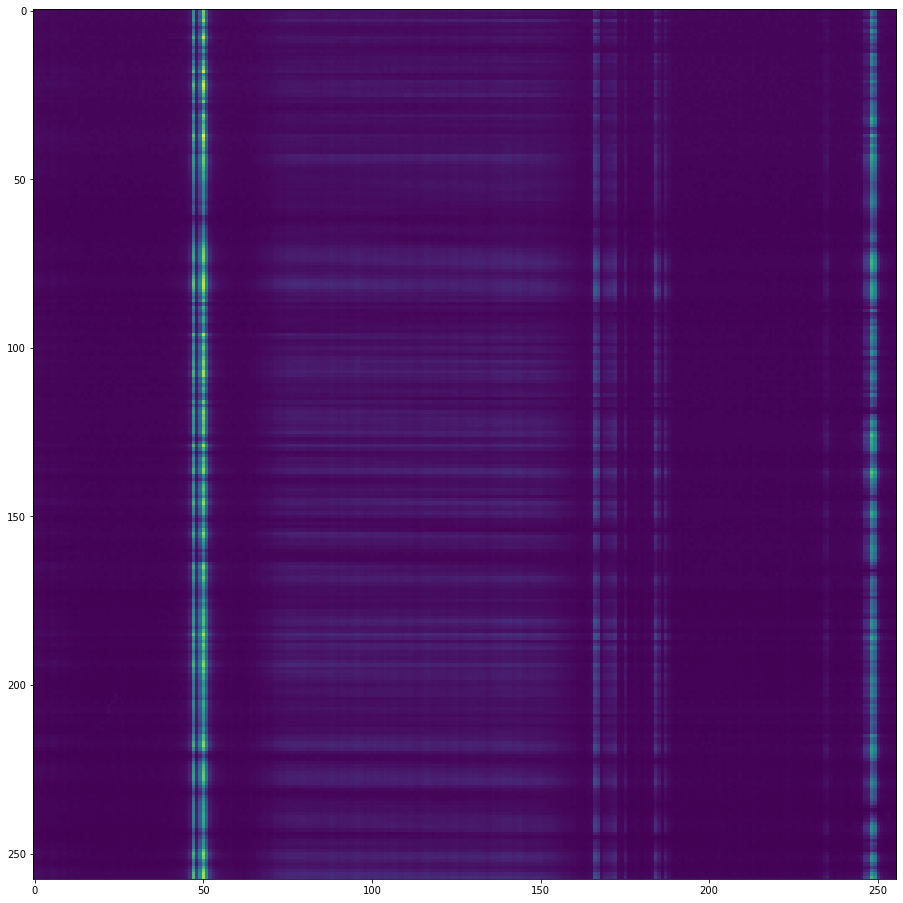

14 14000ab77587


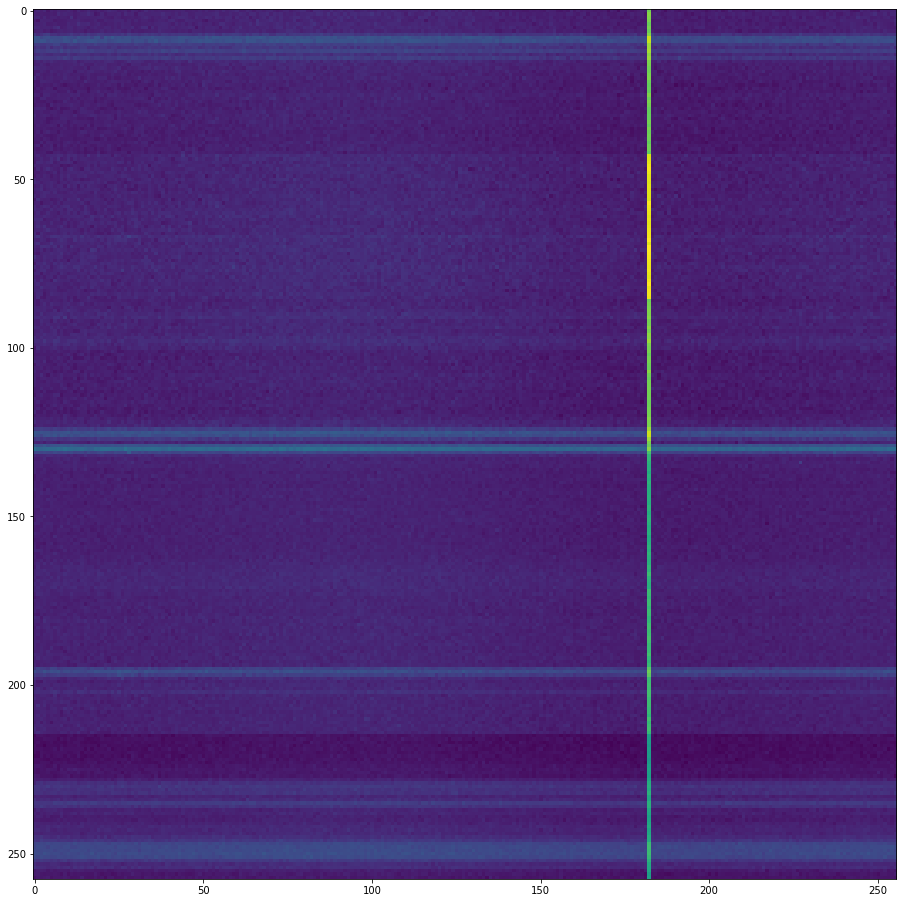

15 14308f15f730


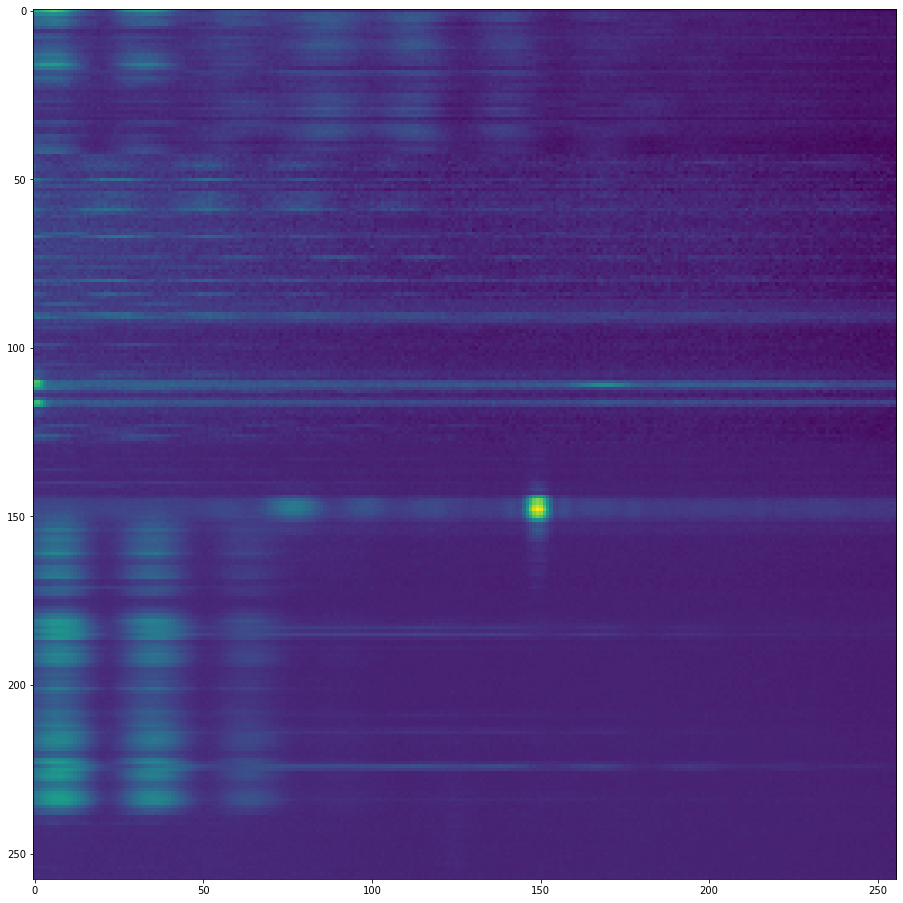

16 1462fb566eb8


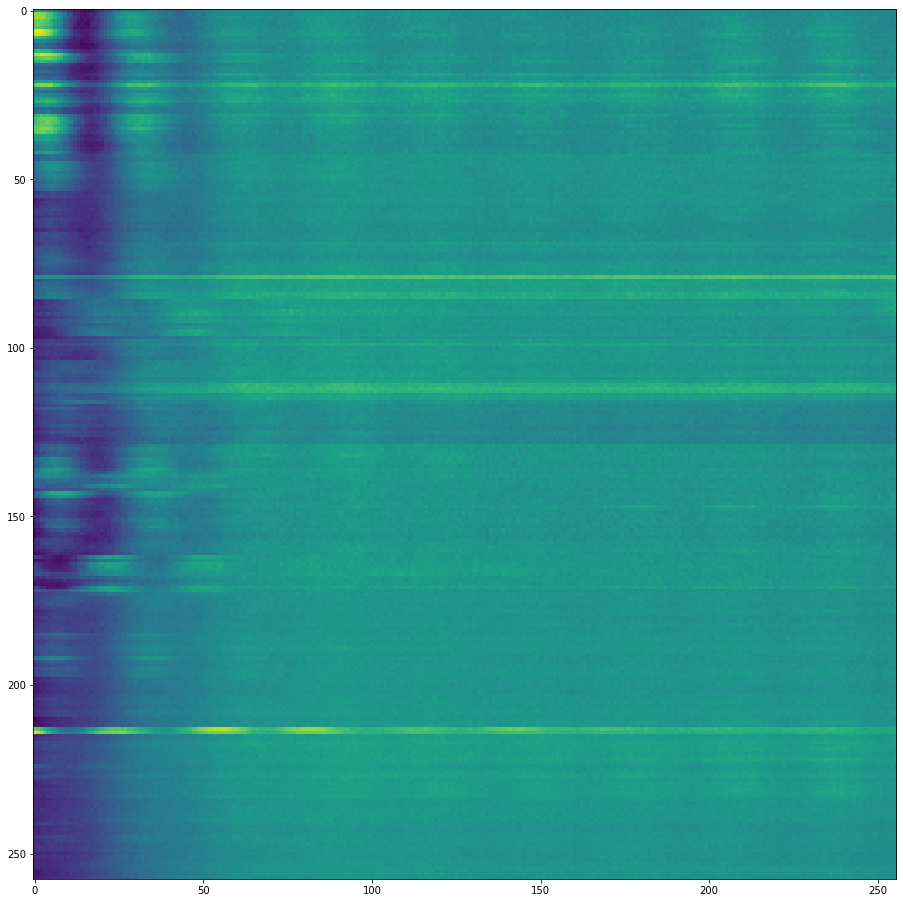

17 1550a2706872


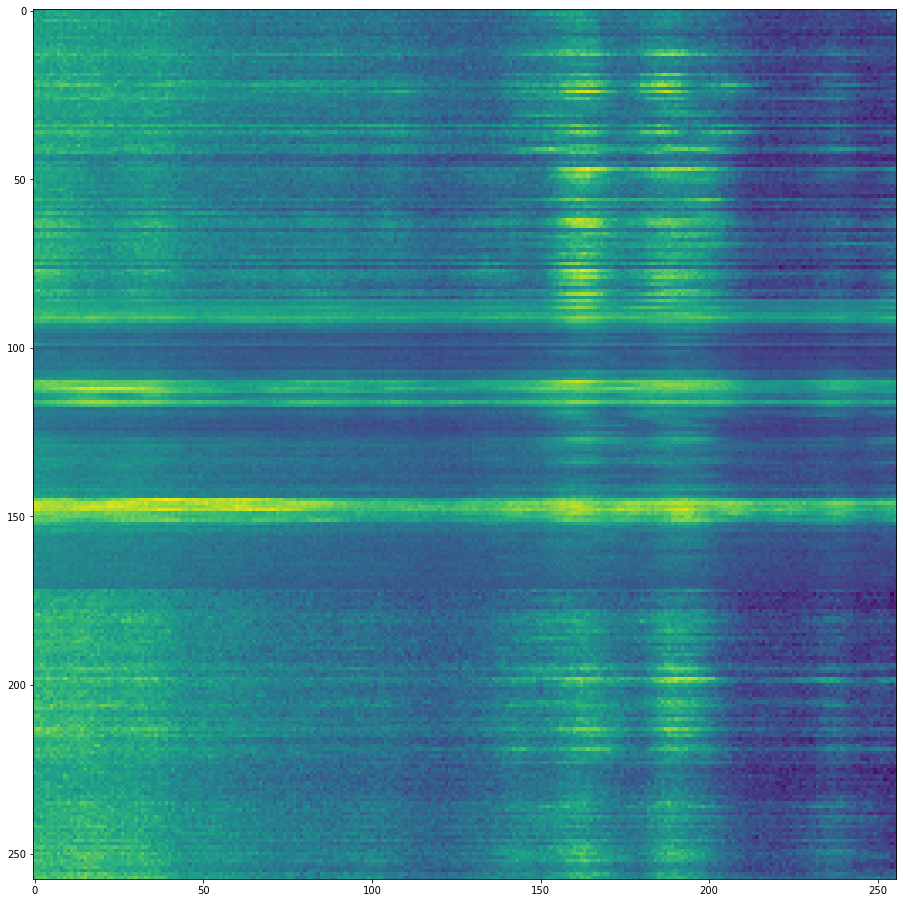

18 15ad0420b5a5


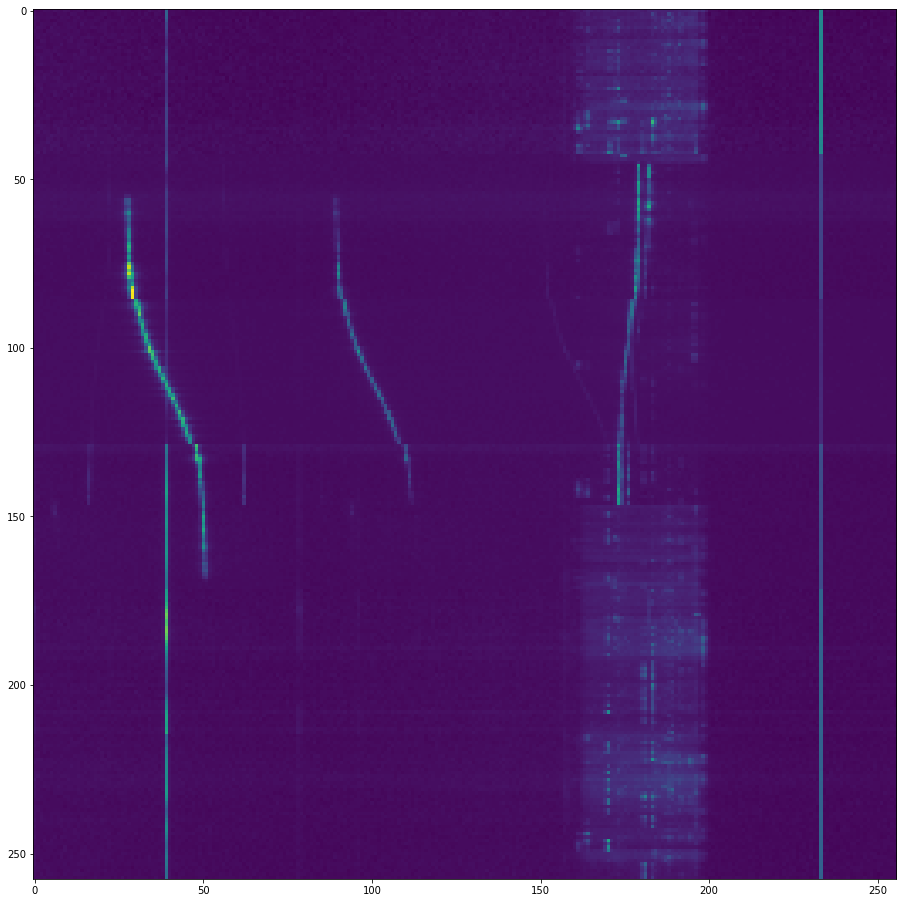

19 15c228a310a9


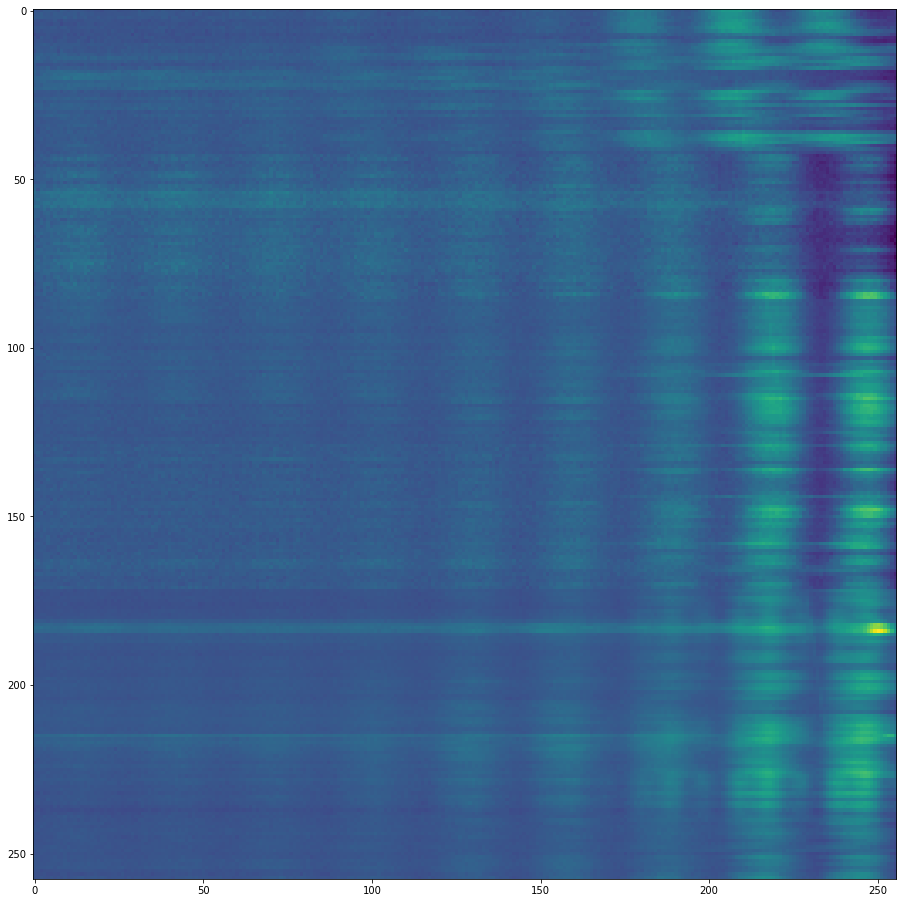

20 163977286841


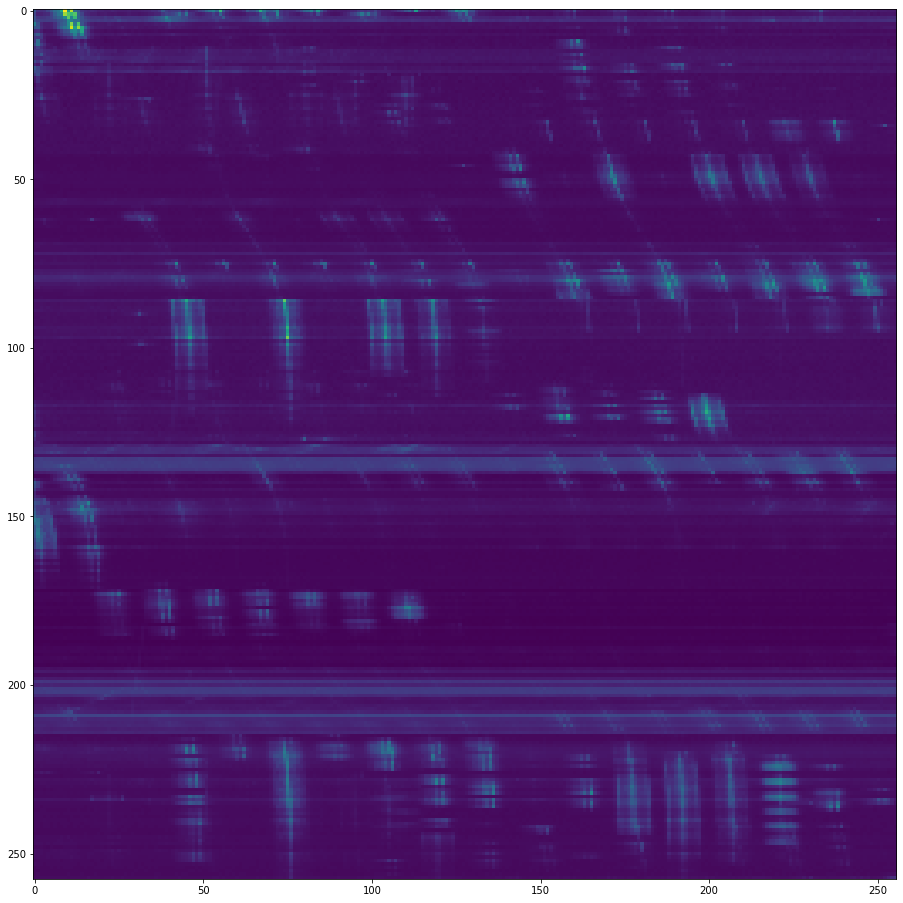

21 17a7c5217942


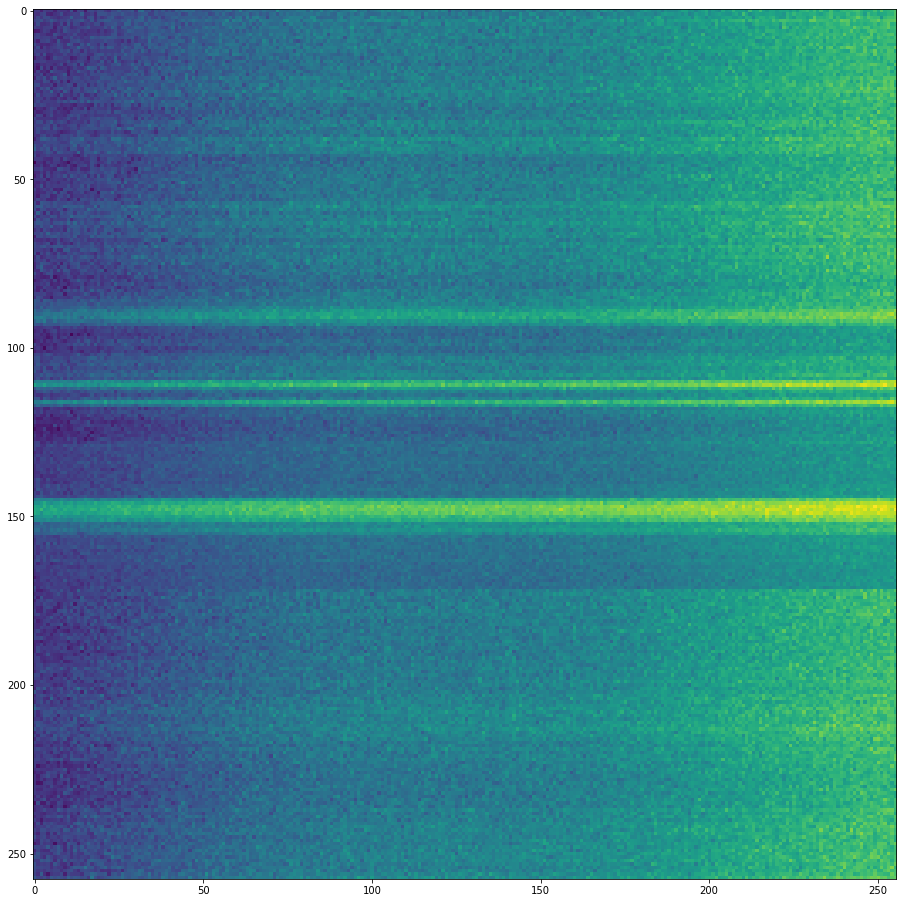

22 17e564a59280


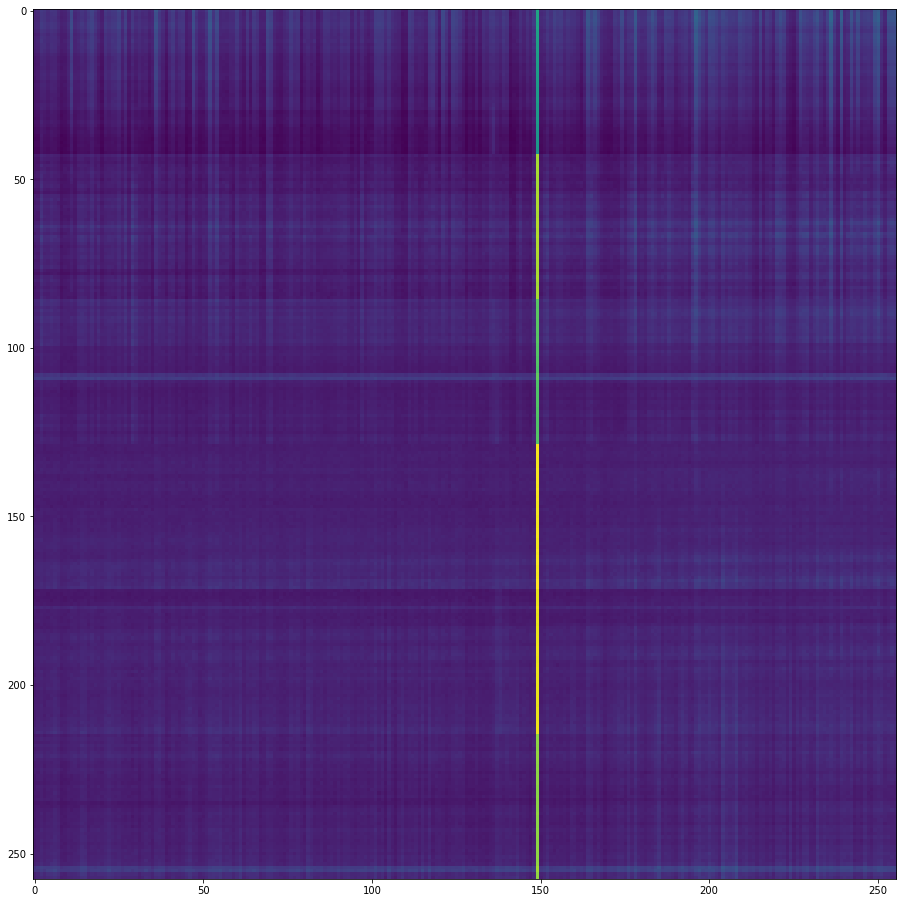

23 18adcf9035f7


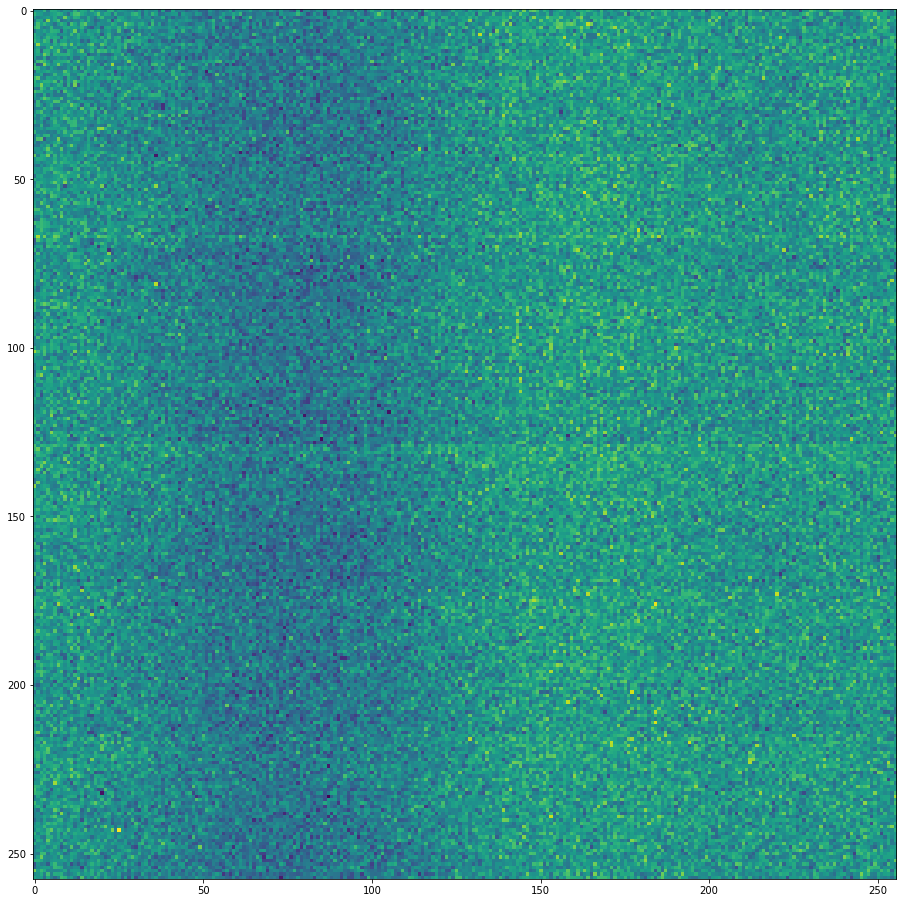

24 1a14c57e8f24


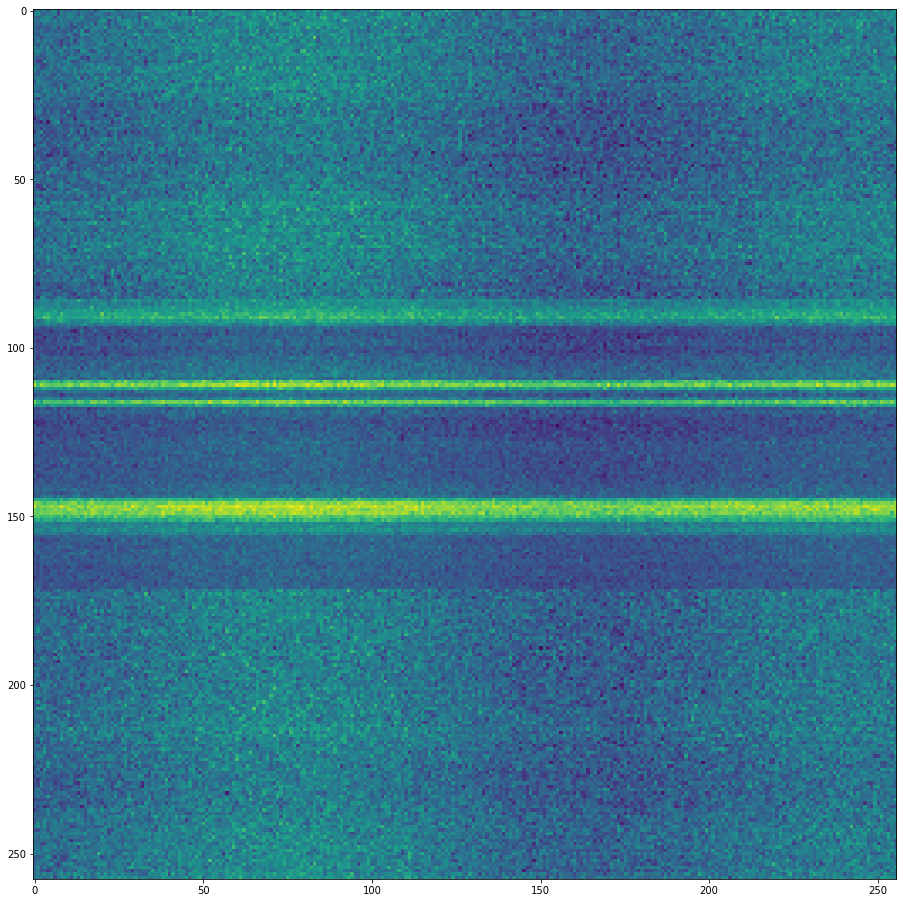

25 1a4b23f9a172


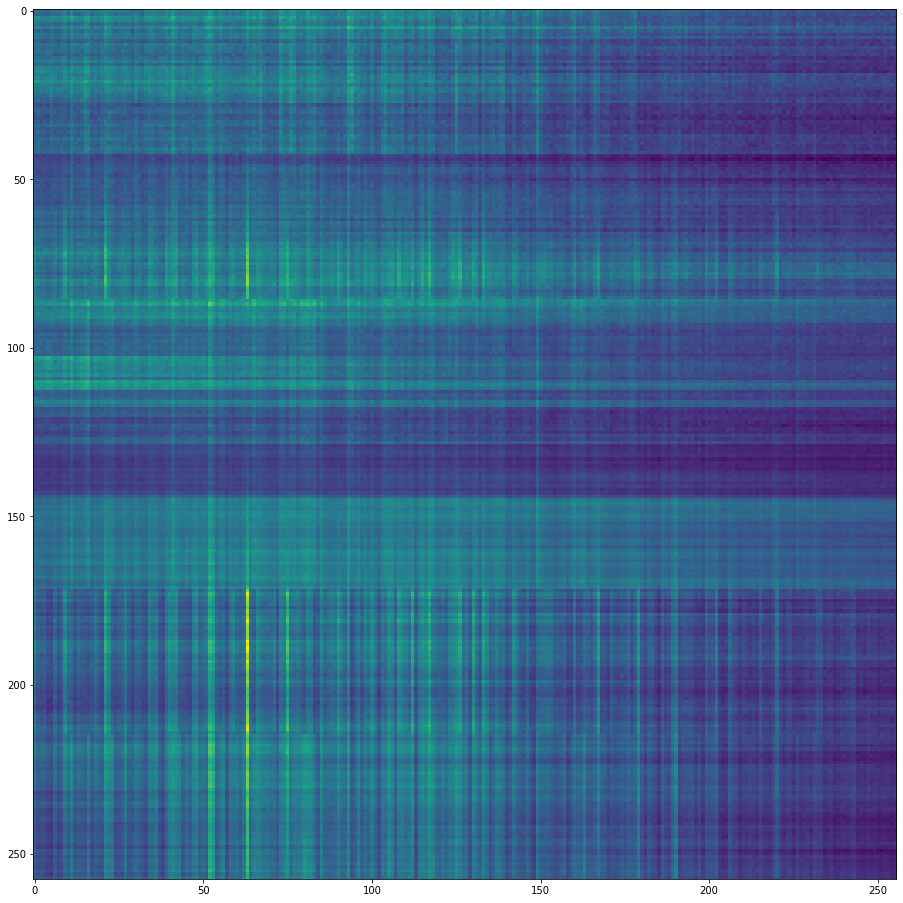

26 1a6ea827da87


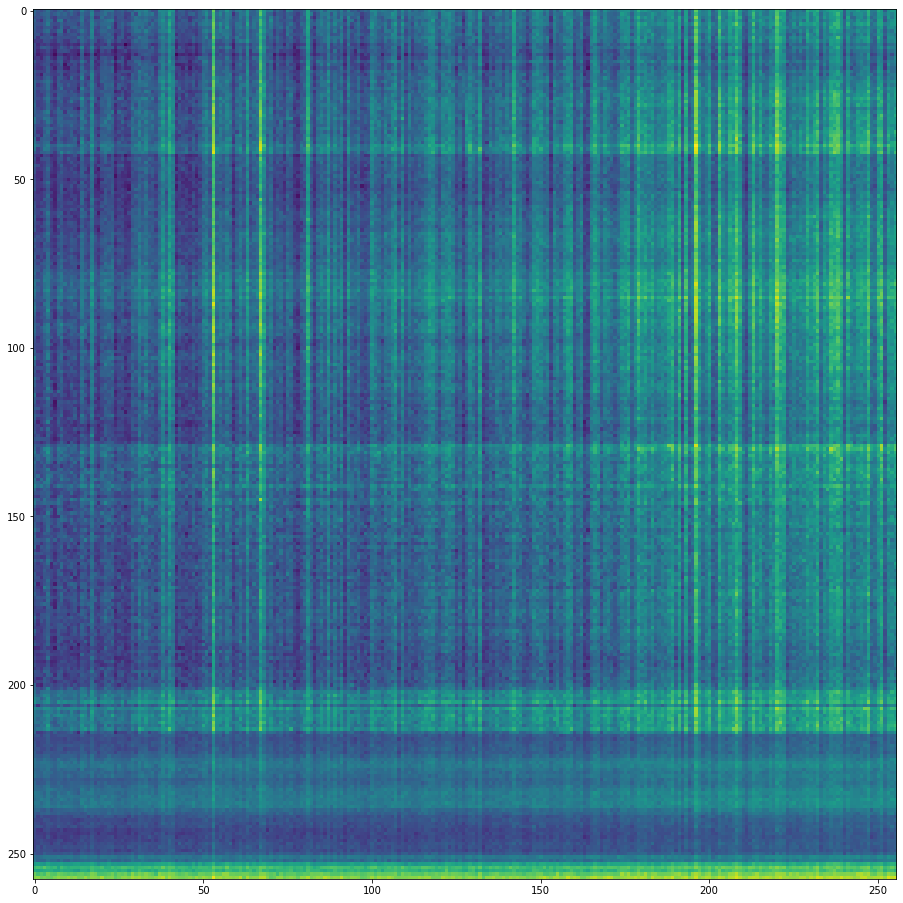

27 1c1307e5ca76


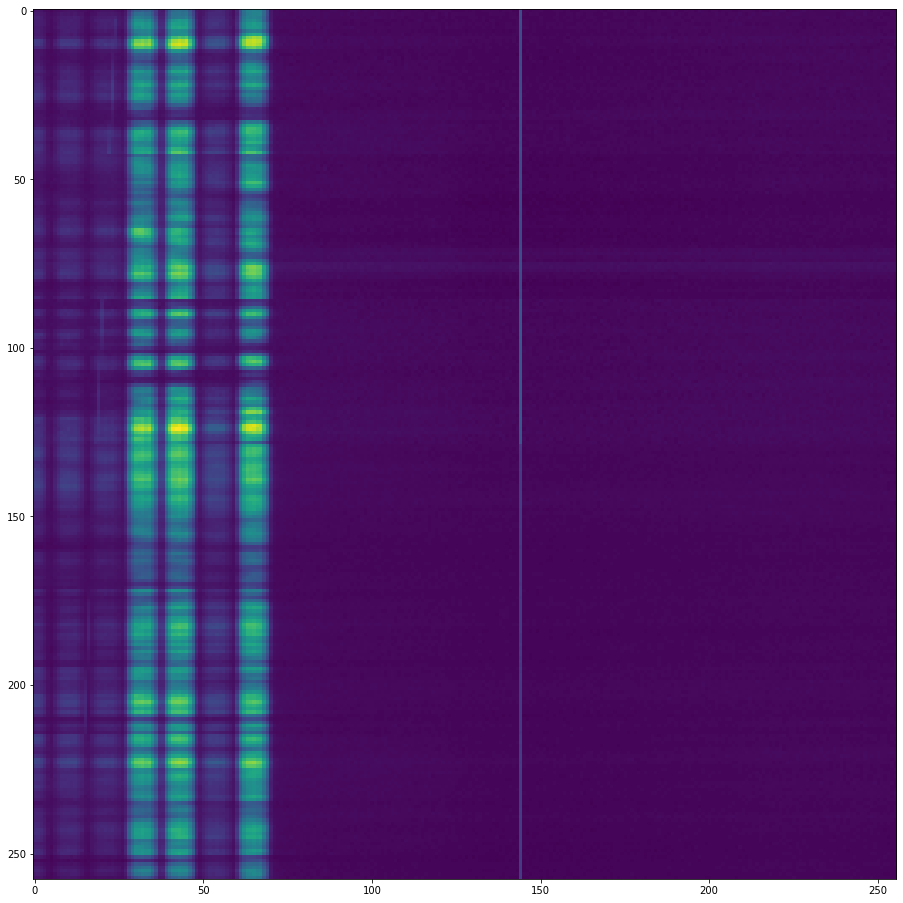

28 1c51c8bddb19


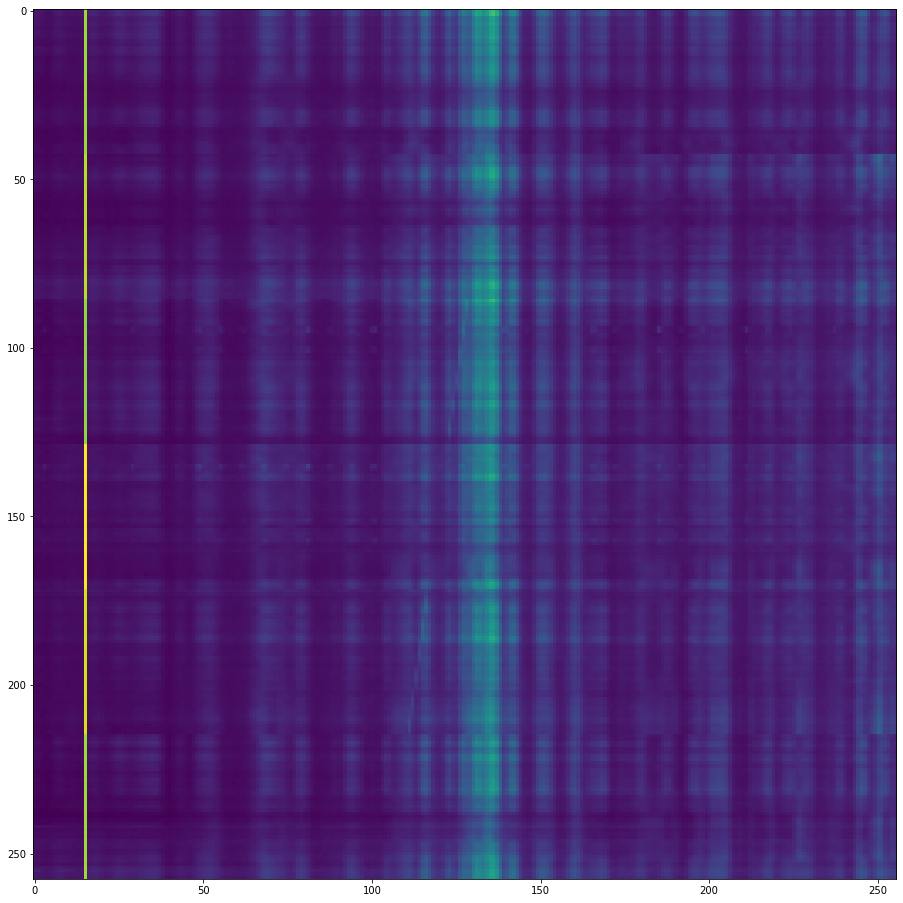

29 1d984a1a3710


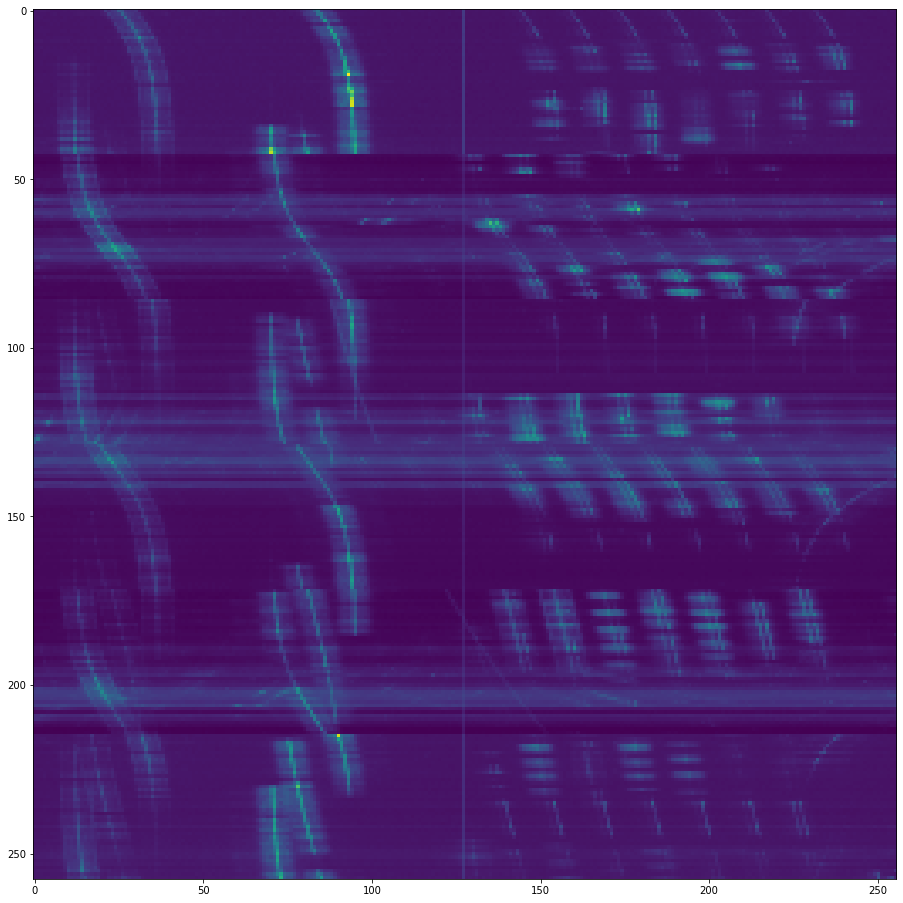

30 1fecdaef44e8


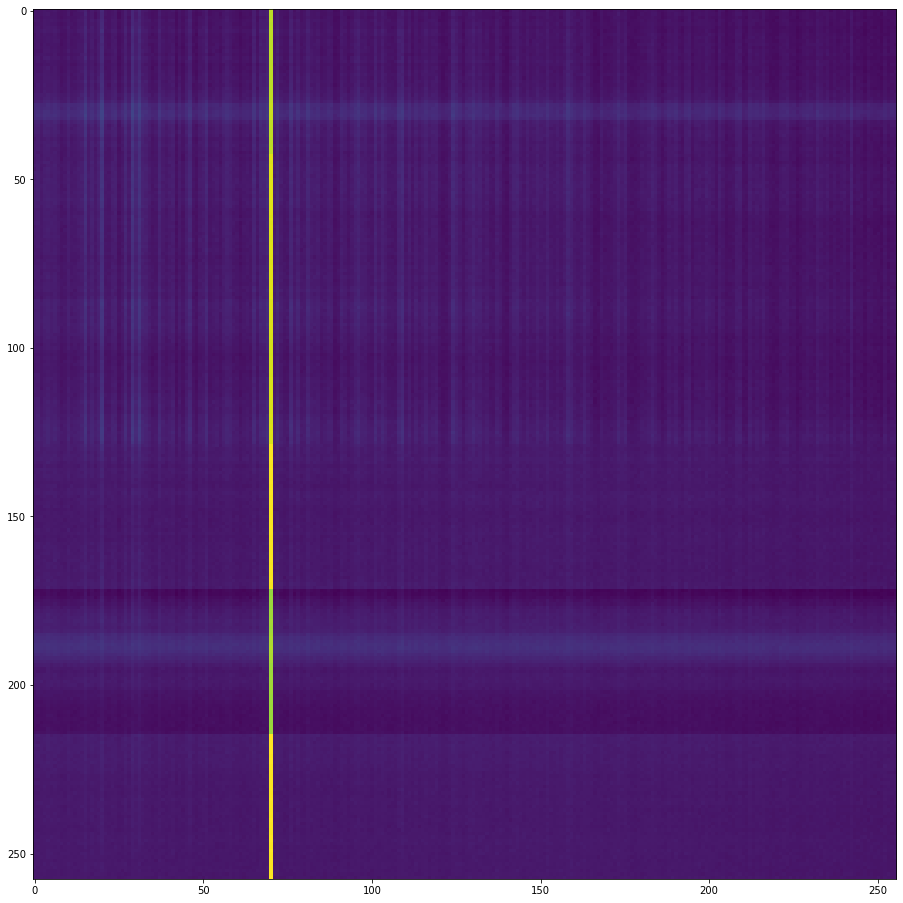

31 2064d5ebe9b5


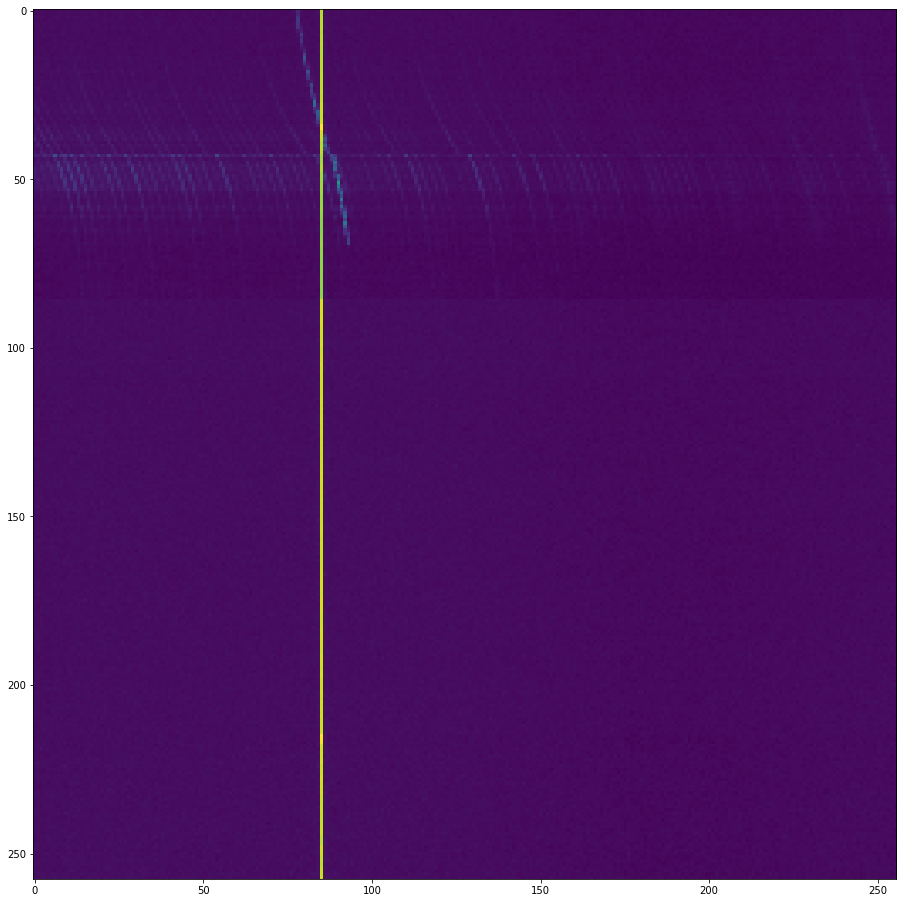

32 20bbc9da4bb2


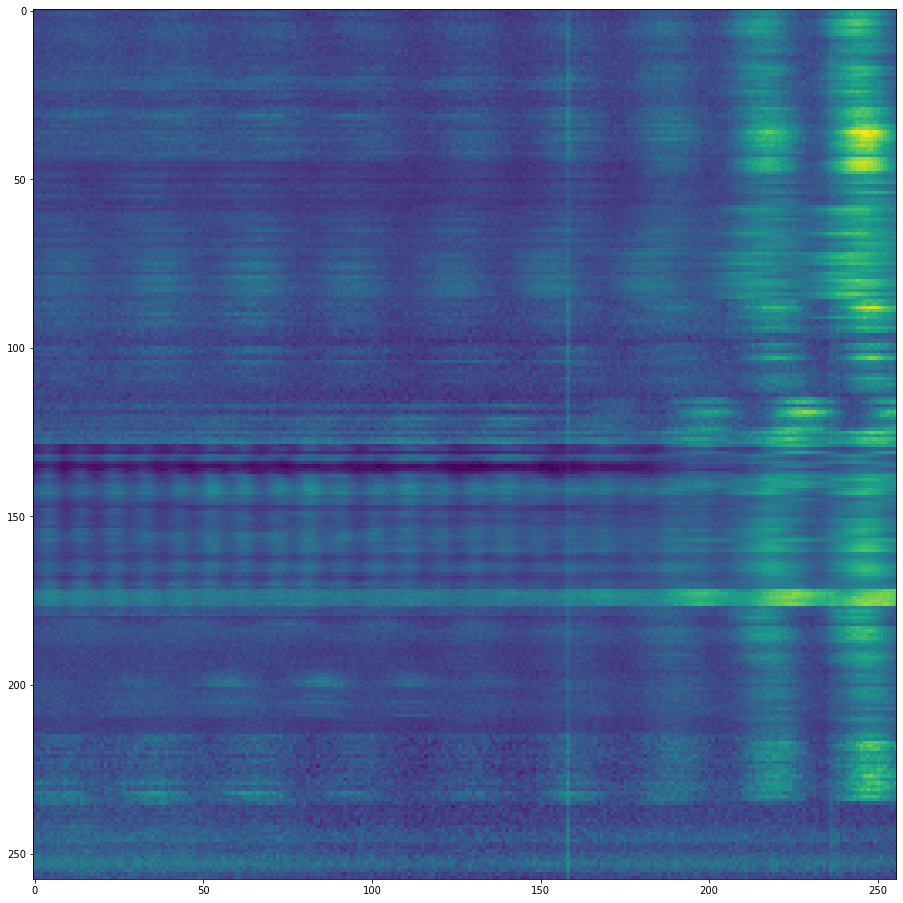

33 24349b96ea8d


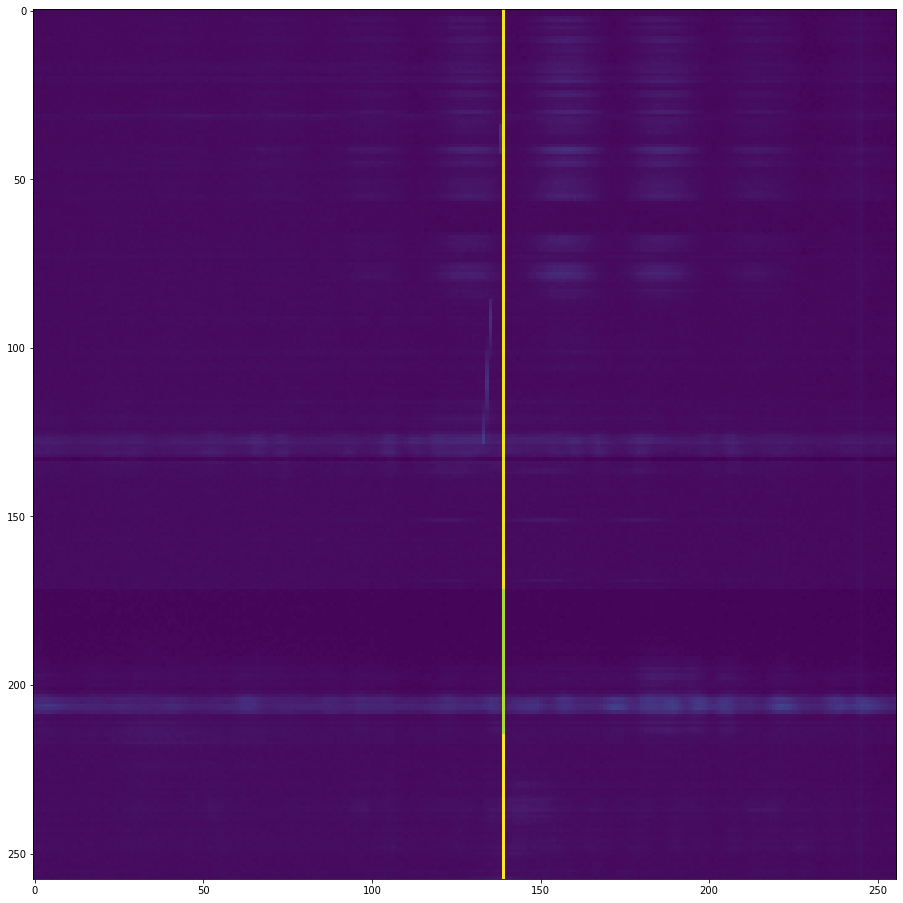

34 2462f14205be


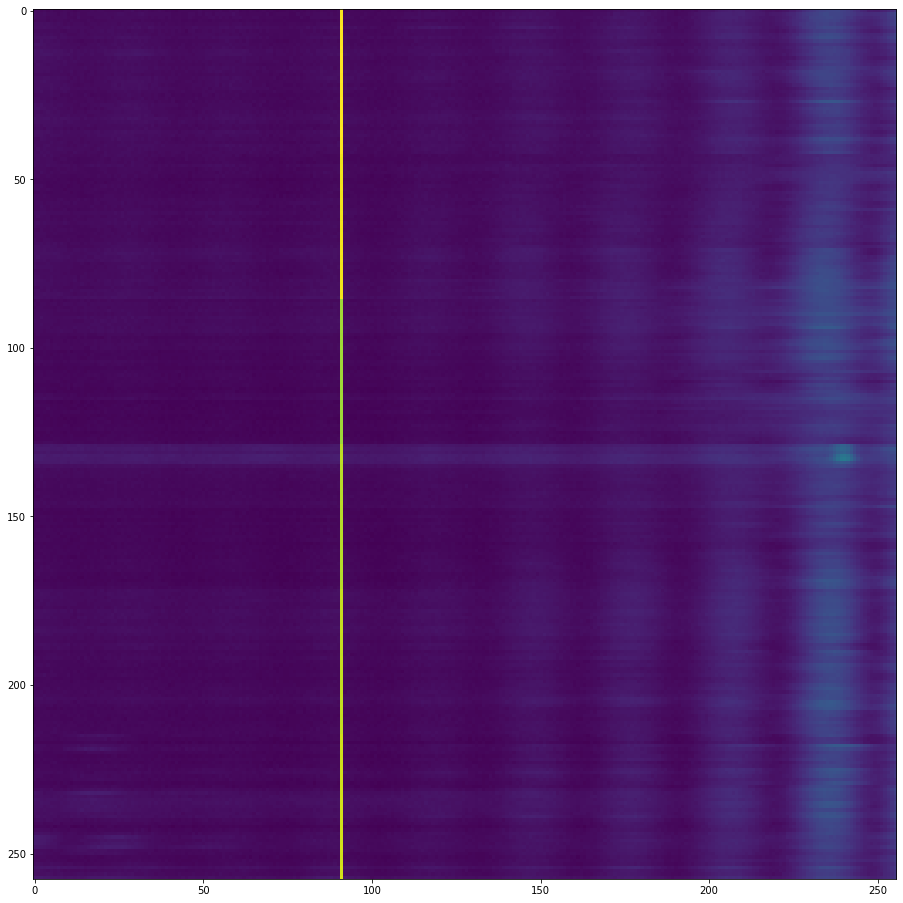

35 248ef095d89d


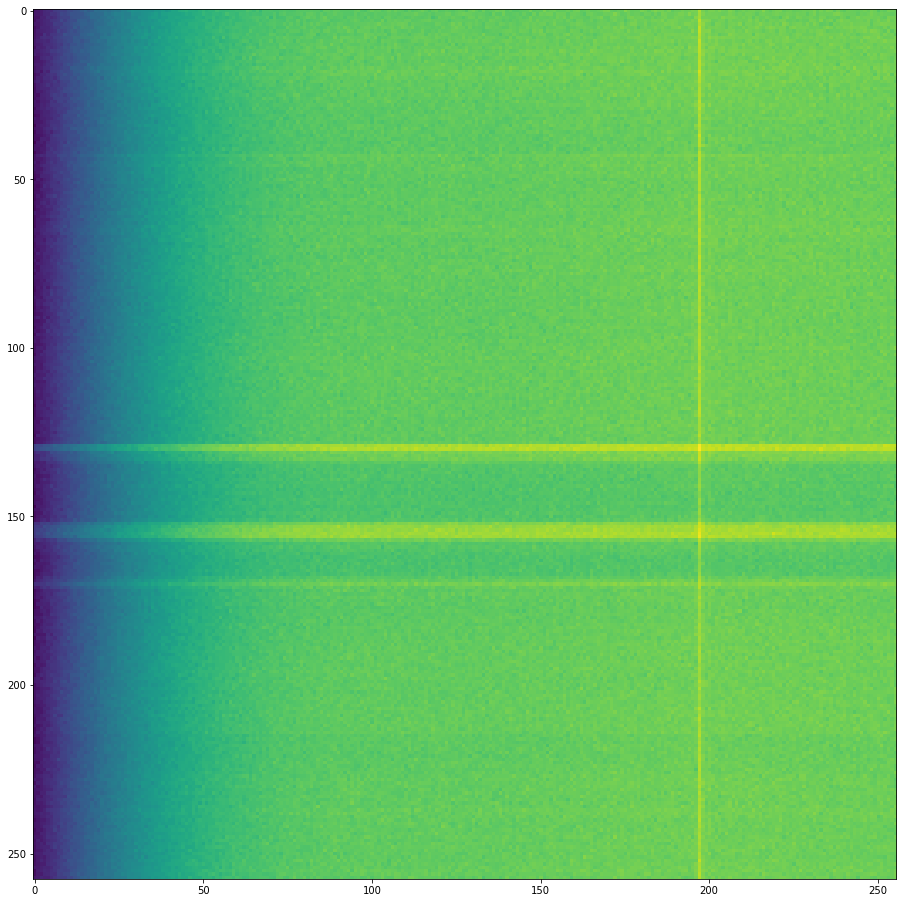

36 2503d7f6e5c4


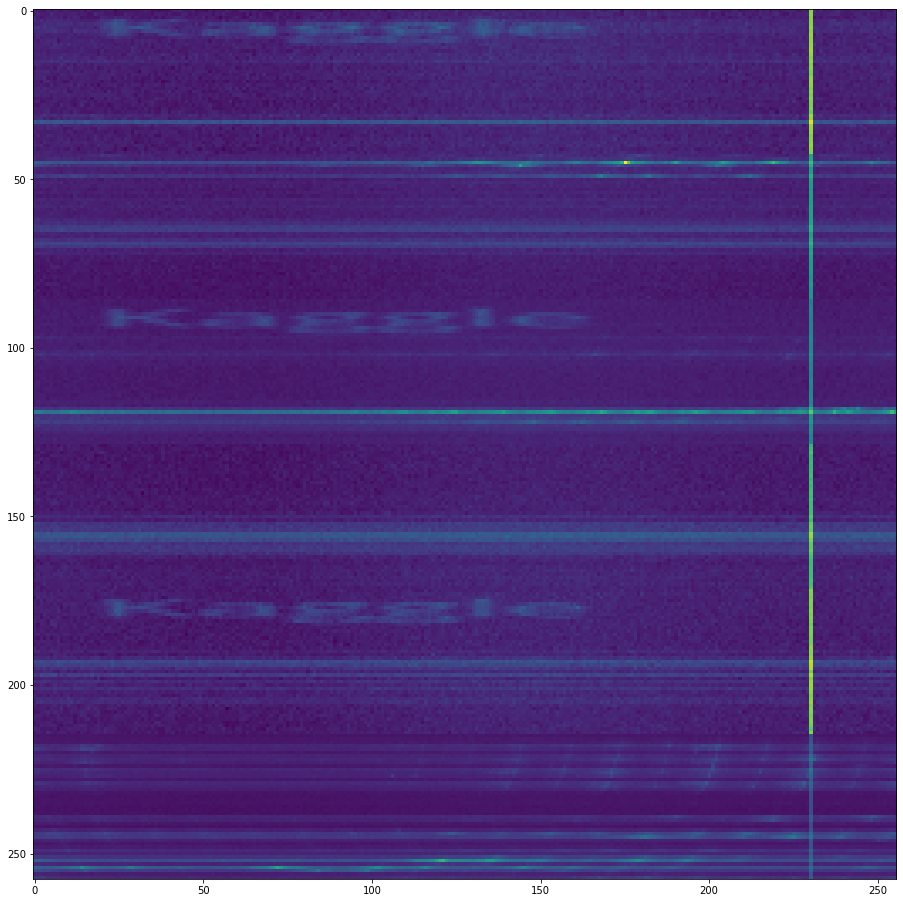

37 25213186b2ee


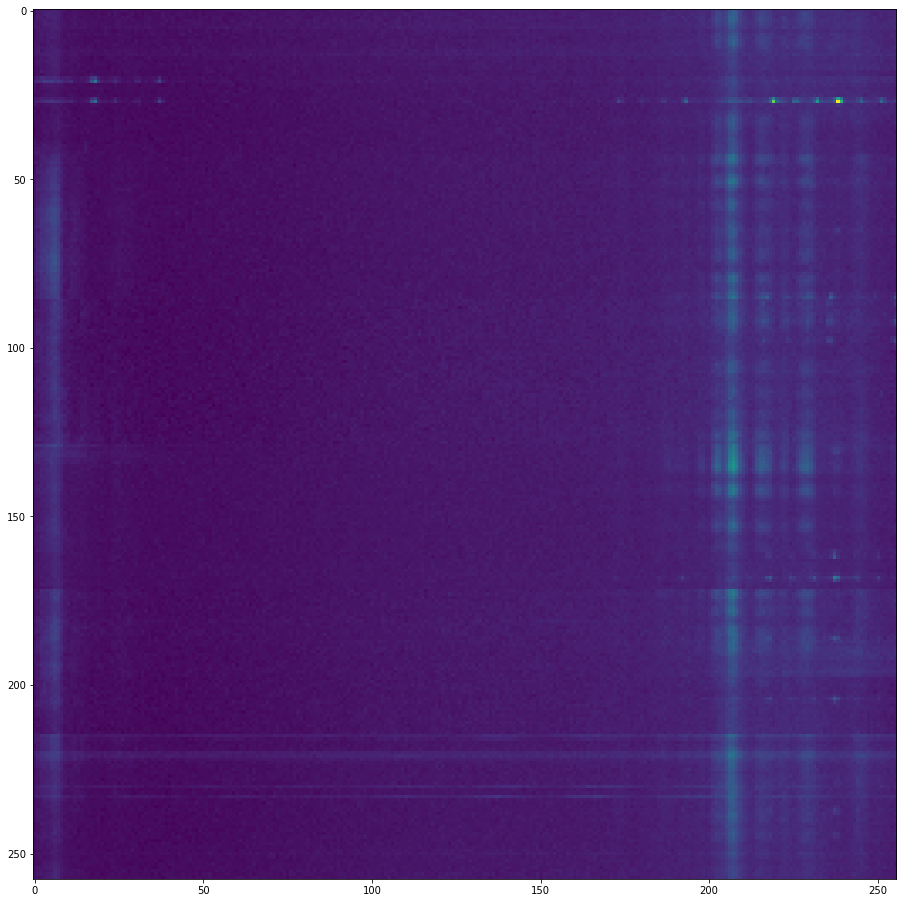

38 269f10aceb23


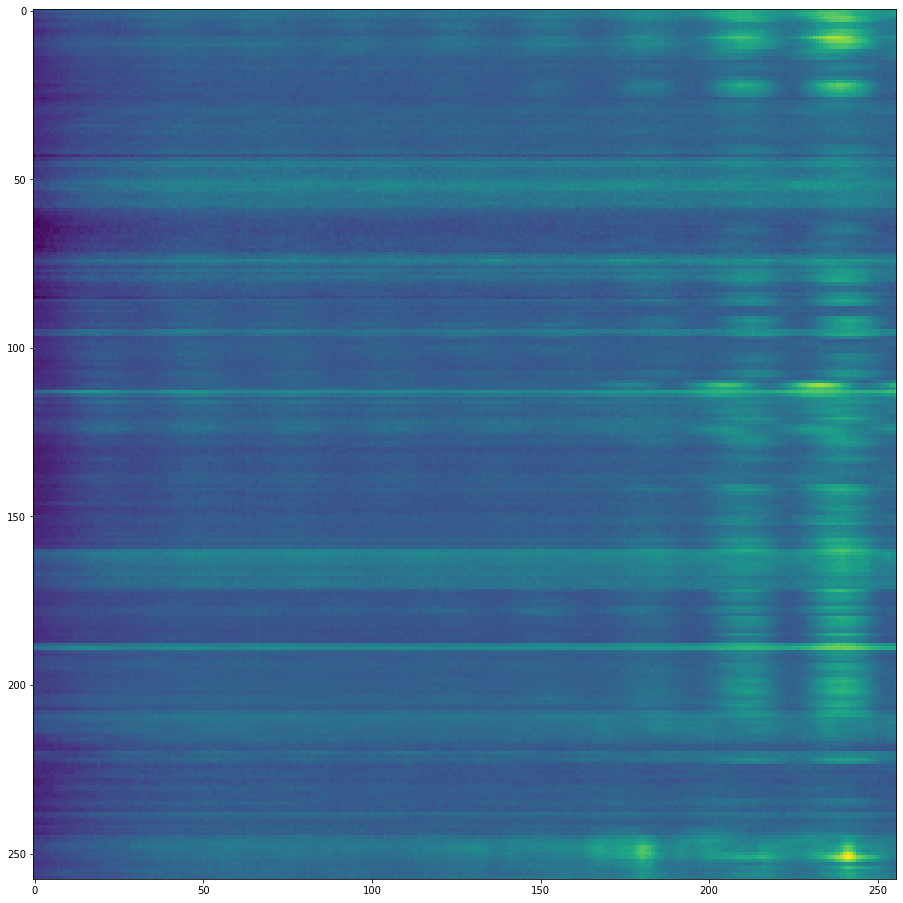

39 26d0871f3b32


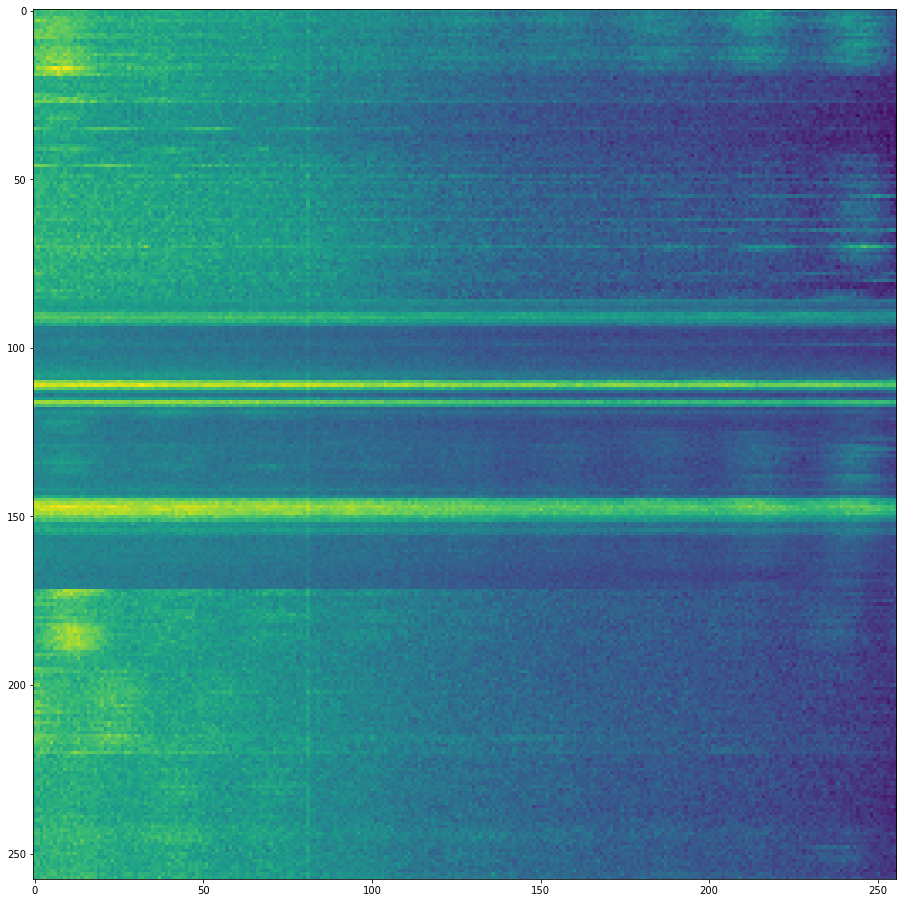

40 27047a900522


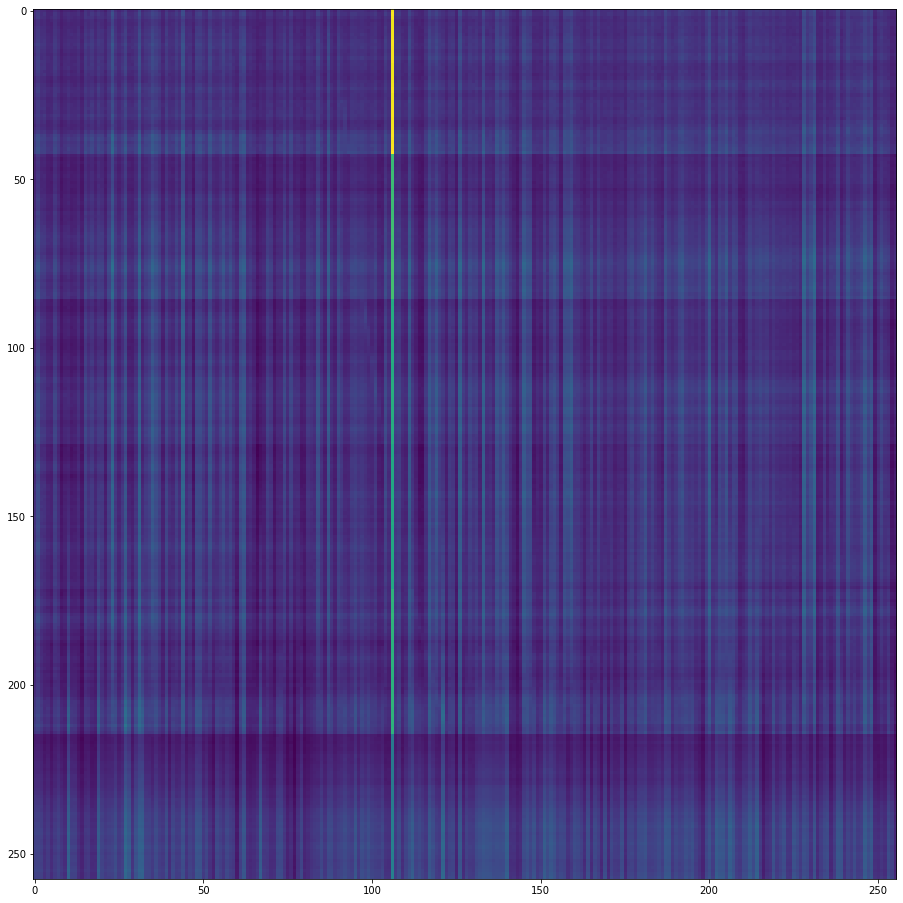

41 27efcfbc6941


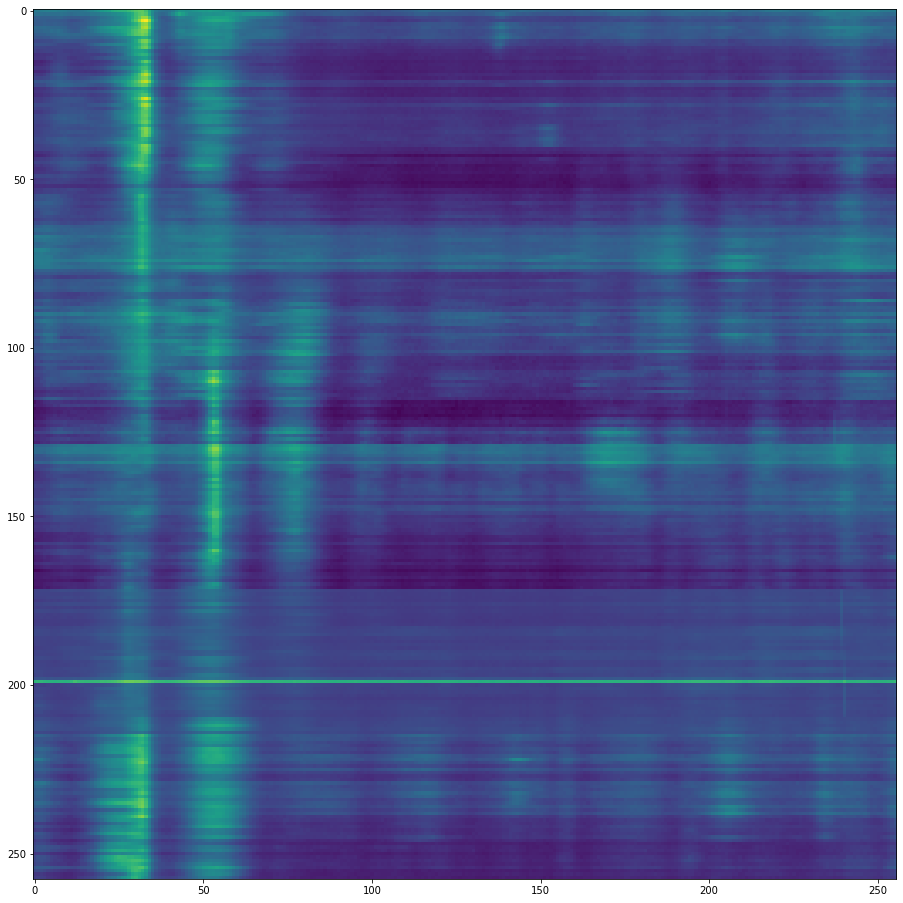

42 288ea03a6e4e


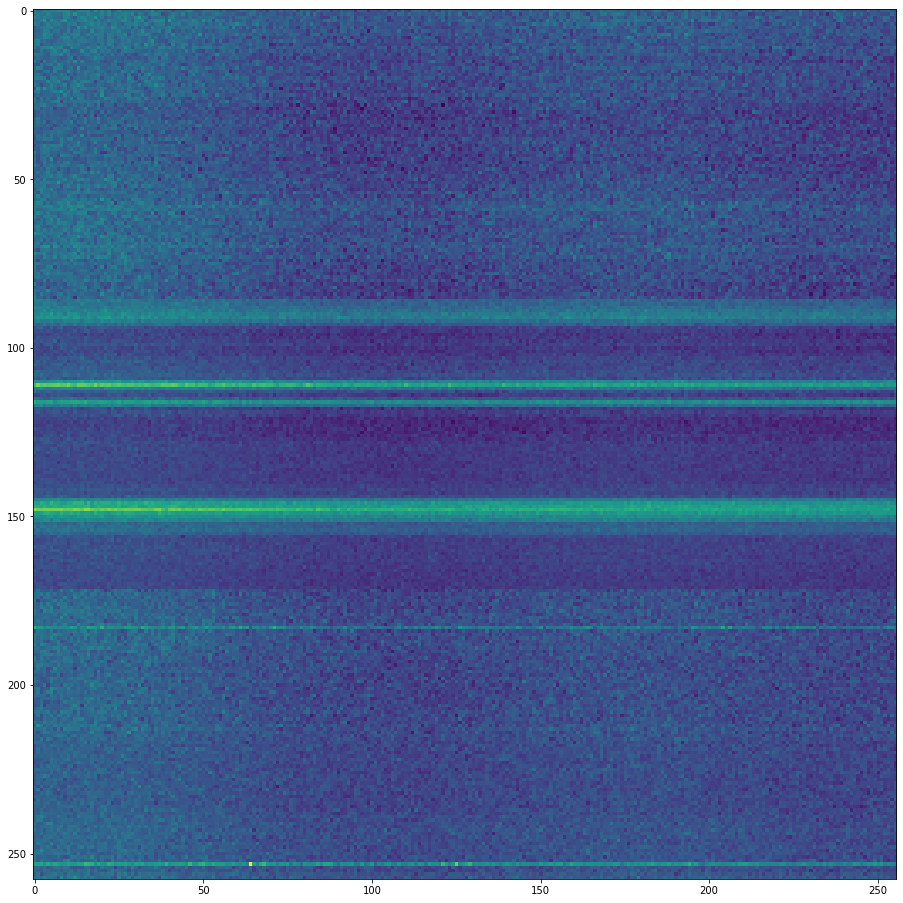

43 296416d70414


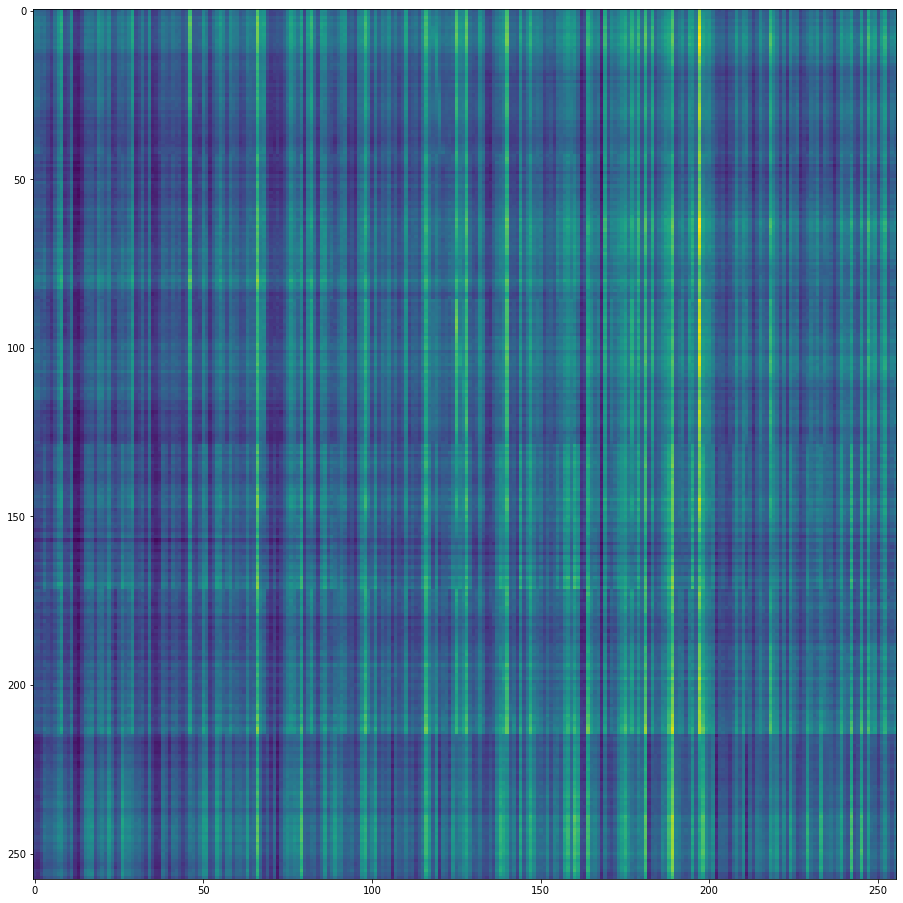

44 2b4f13d2cdf2


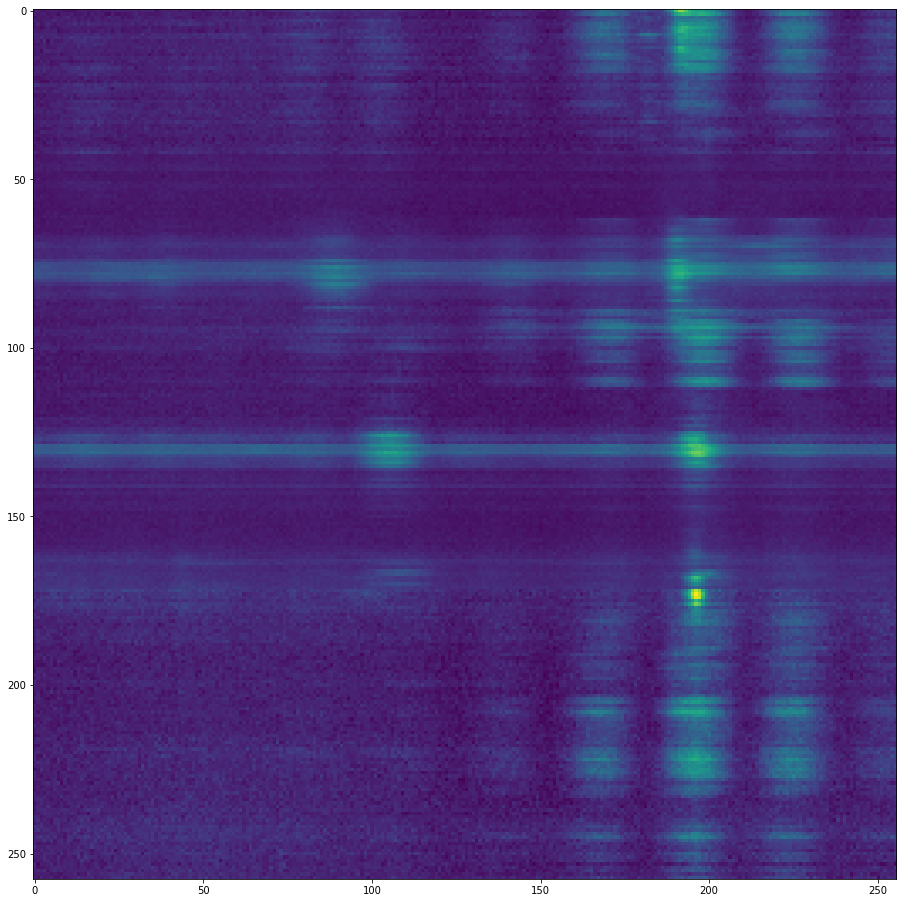

45 2b8fc1b0c116


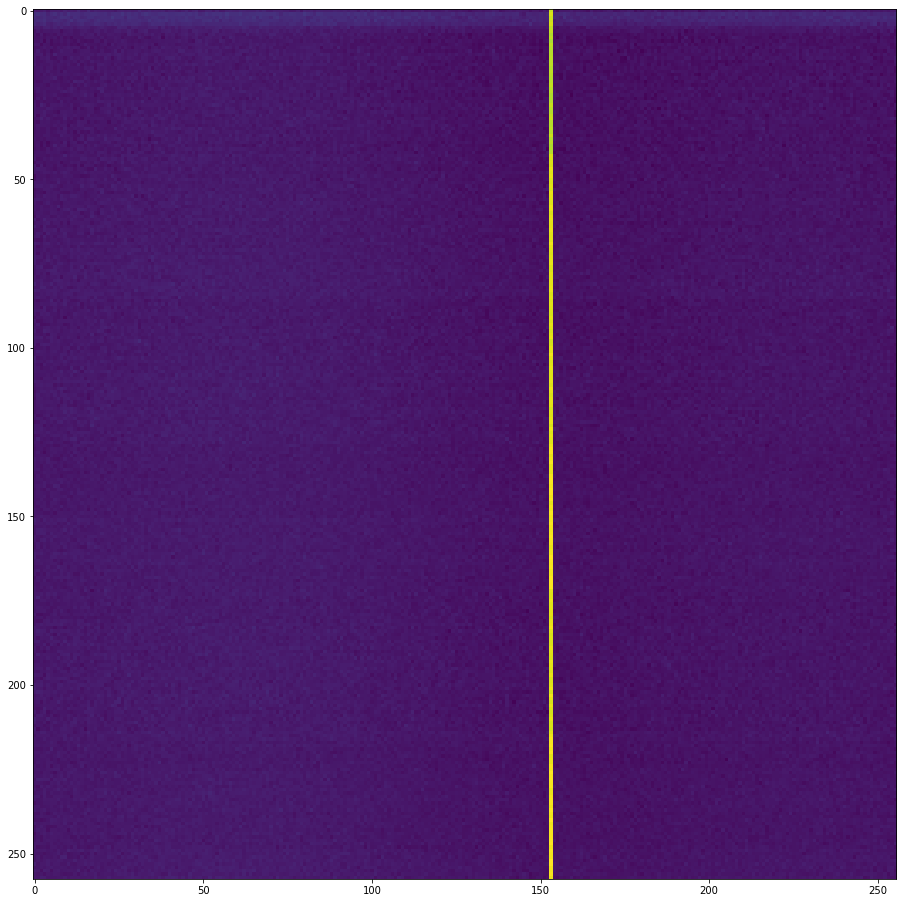

46 2bba01d2e1d2


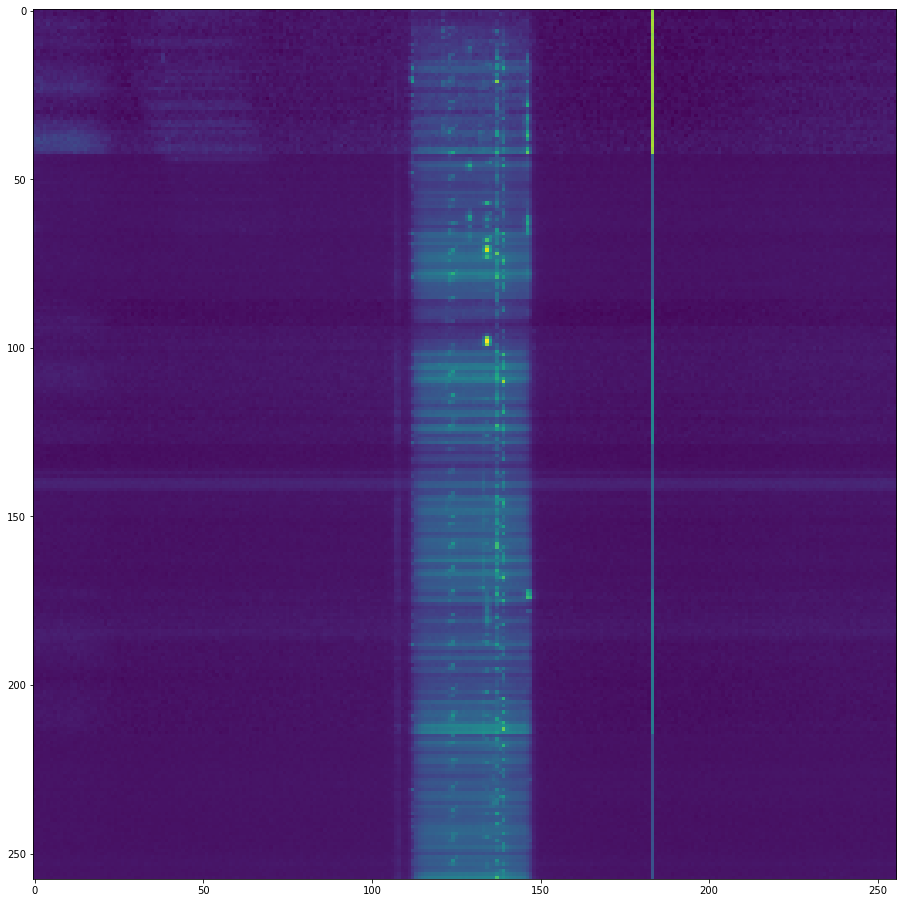

47 2cf6ebf6a942


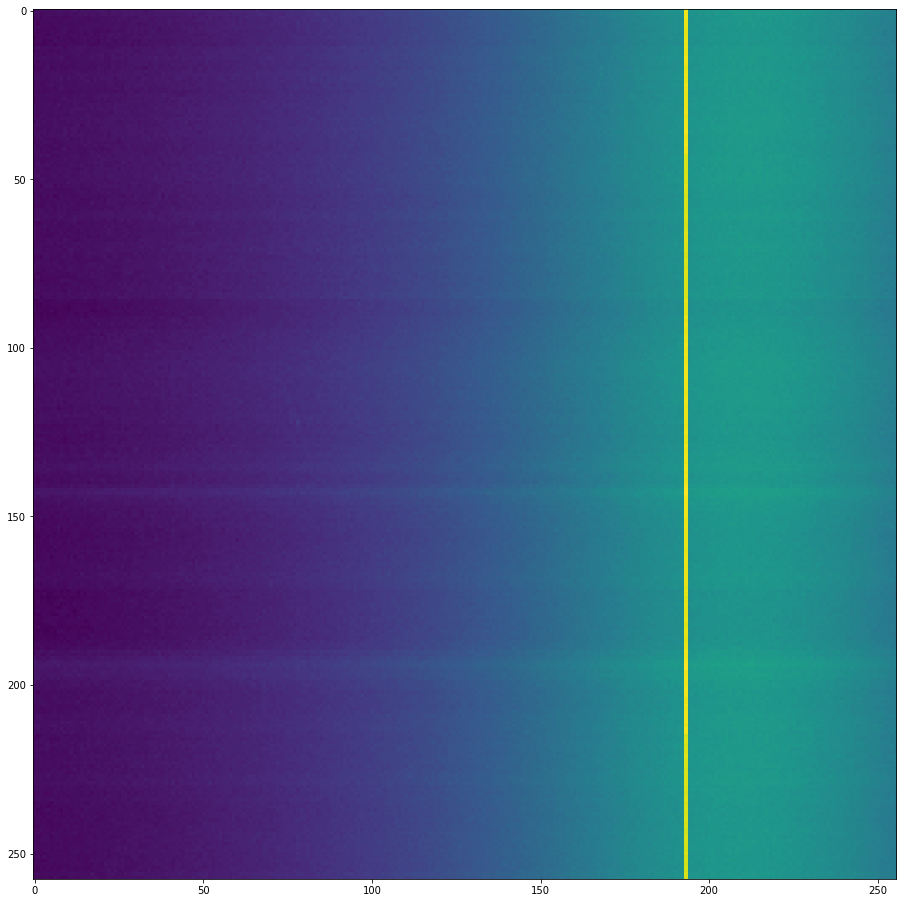

48 2d893ae6f34e


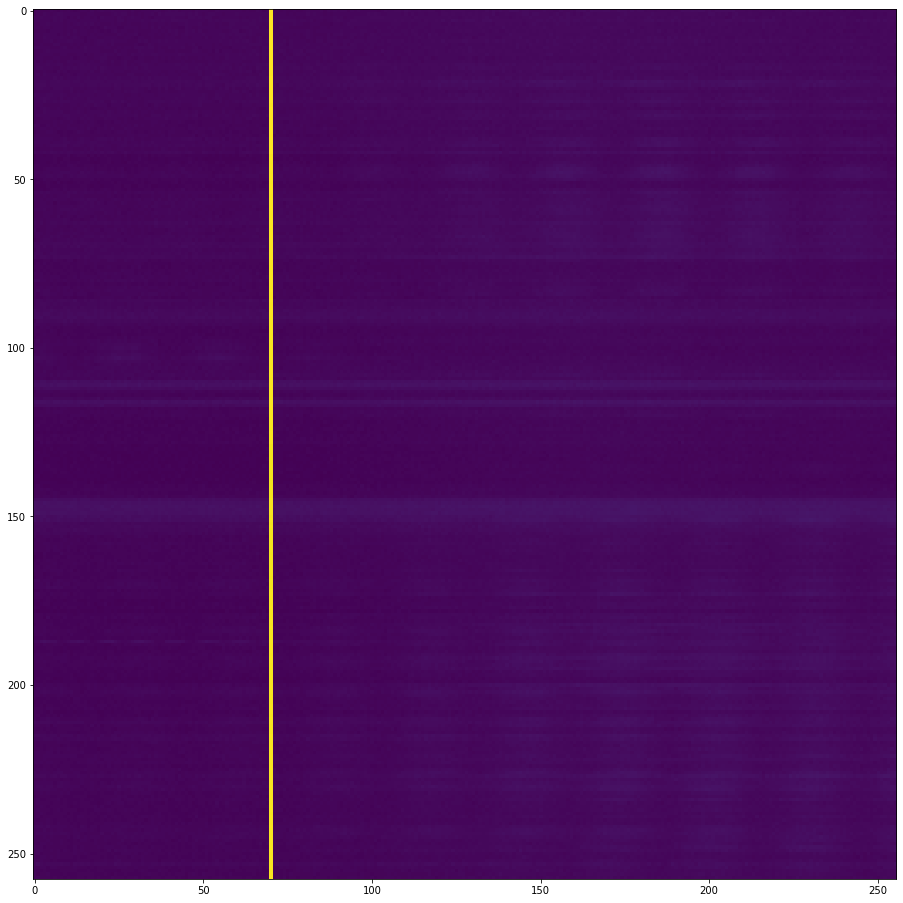

49 32941cf45d9e


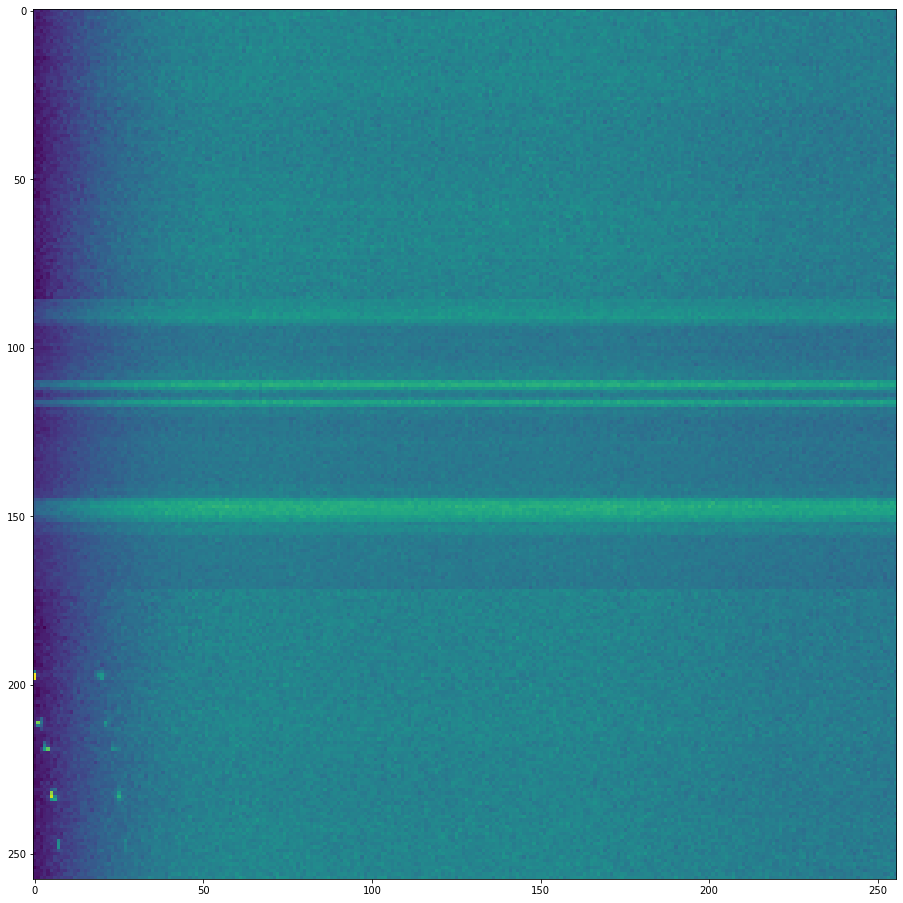

In [39]:
#images classified as negative but are positive 
pos_imgs = trfn.id.values
for i, img in enumerate(pos_imgs[0:50]):
    print(i, img)
    disp_image(f'{config.RESIZED_IMAGE_PATH}train/{img}.npy', (20,16))

In [53]:
trl = pd.read_csv(f'{config.DATA_PATH}train_labels.csv')
trlp = trl[trl['target'] == 1]
trln = trl[trl['target'] == 0]
trln.query(f'''id == '1ba80569438e' ''')

,id,target
5470,1ba80569438e,0


In [56]:
trl = pd.read_csv(f'{config.DATA_PATH}train_labels.csv')
trlp = trl[trl['target'] == 1]
trln = trl[trl['target'] == 0]
trlp.query(f'''id == '00667e94a985' ''')

,id,target
76,00667e94a985,1


In [208]:
# trying to enhance needle
import cv2
import albumentations as A
from PIL import Image

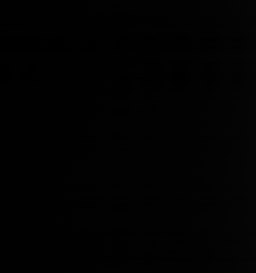

In [214]:
pilimg.show()

In [237]:
i = '0078157399c9'
img = np.load(f'{config.DATA_PATH}train/{i[0]}/{i}.npy')[0].astype(float)
# img = np.amax(img) - img

In [240]:
np.max(img)

1.0

In [230]:
len(np.unique(img))

12681

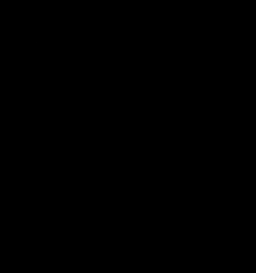

In [245]:
p = Image.fromarray(img)
p.show()

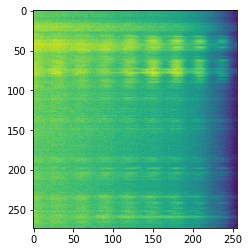

In [244]:
plt.imshow(img)
plt.show()

In [269]:
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-uybuuhhk
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-uybuuhhk
  Created wheel for albumentations: filename=albumentations-1.0.0-py3-none-any.whl size=98141 sha256=05c8a485103deafde76af6721f95ac8af785b2bc2ca40cae375aa5d8b2a157f8
  Stored in directory: /tmp/pip-ephem-wheel-cache-eytguoli/wheels/c5/ca/df/fae131e2d3a8174cd8668f10bf0591fa158f0824214d3017bc
Successfully built albumentations
  Attempting uninstall: decorator
    Found existing installation: decorator 5.0.9
    Uninstalling decorator-5.0.9:
      Successfully uninstalled decorator-5.0.9
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.5.2
    Uninstalling albumentations-0.5.2:
      Successfully uninstalled albumentations-0.5.2


folder exists, make sure this call is from inference.py
original


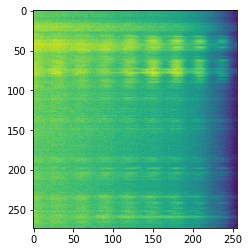

aug


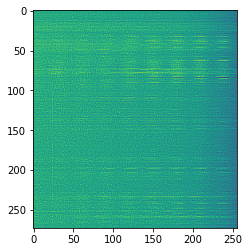

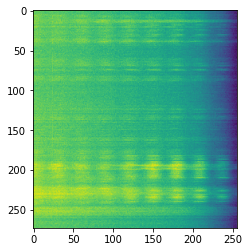

In [1]:
import albumentations as B
import numpy as np
import config
import matplotlib.pyplot as plt
import cv2
i = '0078157399c9'
img = np.load(f'{config.DATA_PATH}train/{i[0]}/{i}.npy')[0].astype(np.float32)
img = (img - np.min(img))/(np.max(img) - np.min(img))
# img = np.max(img) - img
# print(img)


# brightness 1 -- all black
# transform = B.RandomBrightnessContrast(brightness_limit = [0, 0], contrast_limit = [0.5, 0.5], p =1)

transform = B.Sharpen(alpha = [1,1], lightness = [1, 1], p=1)
# transform = B.VerticalFlip(p=1)
# transform = B.ColorJitter(
# #                             brightness = (0.0,0.0),
#                             contrast = (0.2, 0.2),
#                             saturation = 0.2,
#                             hue = 0.2, p =1)
# transform = B.RandomToneCurve(scale = 0.4, p=1)
aug = transform(image = img)['image']
# # aug_img.shape
print('original')
plt.figure()
plt.imshow(img)
plt.show()
print('aug')
plt.figure()
plt.imshow(aug)
plt.show()

r = np.array(list(reversed(img)))
plt.imshow(r)
plt.show()


folder exists, make sure this call is from inference.py


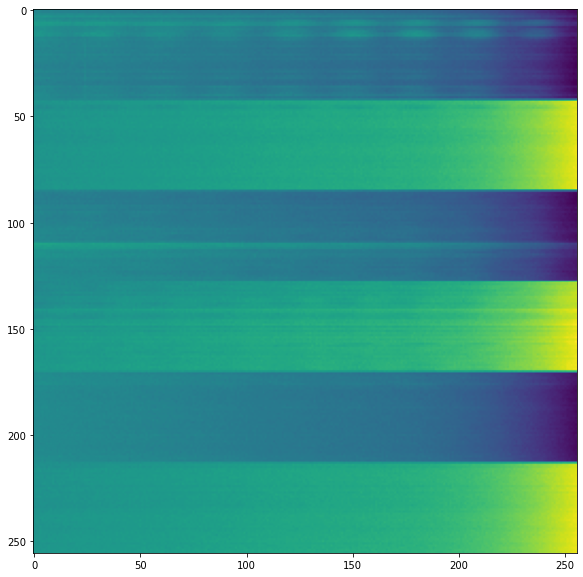

original


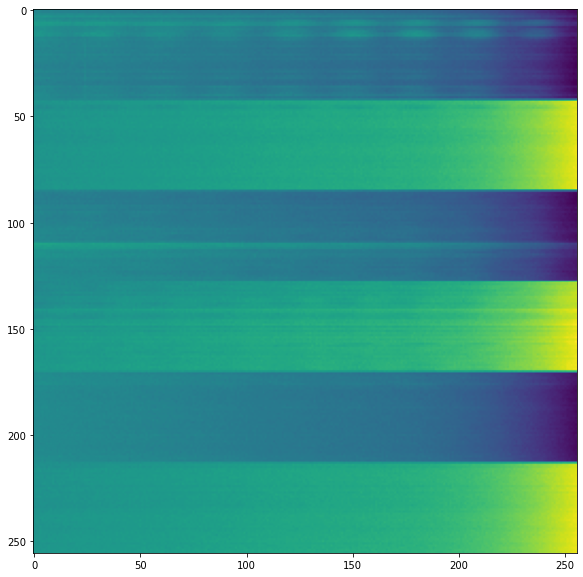

In [1]:
import dataset as q
import config
import matplotlib.pyplot as plt
i = q.SetiDataset([f'{config.DATA_PATH}train/0/0078157399c9.npy'], targets = [1], ids =[0], resize=None, augmentations = True)[0]
# print(i)
plt.figure(figsize = (20,10))
plt.imshow(i['images'][0])
plt.show()
print('original')
plt.figure(figsize = (20,10))
asf = q.SetiDataset([f'{config.DATA_PATH}train/0/0078157399c9.npy'], targets = [1], ids =[0], resize=None, augmentations = None)[0]
plt.imshow(asf['images'][0])
plt.show()

In [31]:
#display original image
def disp_origimage(image_path):
    img = np.load(image_path)
    for i in range(6):
        print(i)
        plt.figure(figsize = (16,10))
        plt.imshow(img[i].astype(float))
        plt.show()
# show fn in original size    
i = trfn.id.values[1]
print(i)
disp_origimage(f'{config.DATA_PATH}train/{i[0]}/{i}.npy')

NameError: name 'trfn' is not defined

{'images': tensor([[[ 2.1016,  0.3325, -0.3000,  ..., 11.1484, 12.3594, 11.8125],
         [ 1.3271,  0.9209, -0.9380,  ..., 11.5469, 11.3125, 11.8984],
         [ 2.2266, -0.2681, -0.8906,  ..., 10.4219, 12.1328, 10.9219],
         ...,
         [ 1.5117,  1.3037, -0.2009,  ..., 10.3438,  9.4141,  9.6562],
         [ 1.2793,  1.0586,  0.3479,  ...,  9.6562, 10.6250,  8.9219],
         [ 2.2500,  2.1797,  0.1114,  ...,  8.8906, 10.7266,  7.4727]]]), 'targets': tensor(1), 'ids': tensor(0, dtype=torch.int32)}


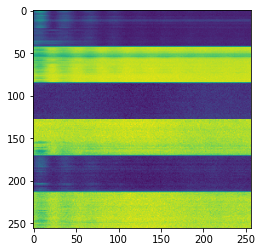

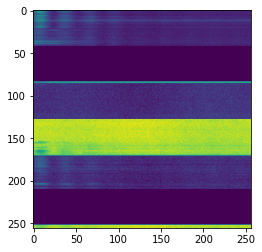

In [27]:
import designimg as di
import config
import dataset as ds
designImage = di.DesignImage(images_set = 'test', out_image_size= config.IMAGE_SIZE,  chl_pos_in_spatial = [0,1,2,3,4,5])
im = designImage.simple_concat(designImage.image_paths[1212])
imt = ds.ImageTransform(im)
# aug = imt.album()
aug = imt.drop_channels(p = 1)
plt.imshow(im)
plt.show()
plt.imshow(aug)
plt.show()

In [12]:
import dataset as q
import config
import matplotlib.pyplot as plt
i = q.SetiDataset([(designImage.image_paths[34])], targets = [1], ids =[0], resize=None, augmentations = True)[0]
# print(i)
plt.figure(figsize = (20,10))
plt.imshow(i['images'][0])
plt.show()
print('original')
plt.figure(figsize = (20,10))
asf = q.SetiDataset([f'{config.DATA_PATH}train/0/0078157399c9.npy'], targets = [1], ids =[0], resize=None, augmentations = None)[0]
plt.imshow(asf['images'][0])
plt.show()

error: OpenCV(4.5.2) :-1: error: (-5:Bad argument) in function 'filter2D'
> Overload resolution failed:
>  - src data type = 23 is not supported
>  - Expected Ptr<cv::UMat> for argument 'src'
